# Training Notebook

In [42]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [43]:
# import libraries
from sklearn.metrics import classification_report
from tensorflow.keras import layers
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import gc
import tensorflow as tf
from tensorflow import keras
import numpy.random as npr
import matplotlib.pyplot as plt
import warnings  
import os
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
tf.get_logger().setLevel('ERROR')
%matplotlib inline
plt.style.use('bmh')

In [44]:
tf.autograph.set_verbosity(1)

In [45]:
from tensorflow.python.client import device_lib
assert 'GPU' in str(device_lib.list_local_devices())

In [46]:
tf.config.set_soft_device_placement(True)
gpus = tf.config.list_logical_devices('GPU')
strategy = tf.distribute.MirroredStrategy(gpus)
gpus

[LogicalDevice(name='/device:GPU:0', device_type='GPU'),
 LogicalDevice(name='/device:GPU:1', device_type='GPU')]

In [47]:
# Loading Data
X_train_full = np.load('fixed_data/custom_data.npy').T
t_train_full = np.load('fixed_data/custom_labels.npy')

print(X_train_full.shape, t_train_full.shape)

(6684, 50176) (6684,)


In [48]:
contempt_idx = []
for i in range(len(t_train_full)):
    if t_train_full[i] == 6:
        t_train_full[i] = 0
    elif t_train_full[i] == 7:
        contempt_idx.append(i)

X_train_full = np.delete(X_train_full, contempt_idx, 0) 
t_train_full = np.delete(t_train_full, contempt_idx)
print(X_train_full.shape, t_train_full.shape)

(6665, 50176) (6665,)


In [187]:
# Loading Data
X_train_add = np.load('fixed_data/ck_add_data.npy')
t_train_add = np.load('fixed_data/ck_add_labels.npy')
print(X_train_add.shape, t_train_add.shape)

(309, 50176) (309,)


In [188]:
X_train_full = np.concatenate((X_train_full, X_train_add), axis=0)
t_train_full = np.concatenate((t_train_full, t_train_add))
print(X_train_full.shape, t_train_full.shape)

(6974, 50176) (6974,)


### JAFFE Data

In [49]:
# Loading Data
X_train_full = np.load('fixed_data/JAFFE_data.npy').T
t_train_full = np.load('fixed_data/JAFFE_labels.npy')

print(X_train_full.shape, t_train_full.shape)

(213, 150528) (213,)


### CK+ Data

In [85]:
# Loading Data
X_train_full = np.load('fixed_data/CK+_data.npy').T
t_train_full = np.load('fixed_data/CK+_labels.npy')

print(X_train_full.shape, t_train_full.shape)

(919, 150528) (919,)


# NHF Data

In [7]:
# Loading Data
X_train_full = np.load('fixed_data/NHF_data.npy').T
t_train_full = np.load('fixed_data/NHF_labels.npy')

print(X_train_full.shape, t_train_full.shape)

(5558, 150528) (5558,)


In [155]:
#for i in range(len(t_train_full)):
#    if t_train_full[i]==6:
#        t_train_full[i] = 0

In [238]:
X_train_full.dtype, t_train_full.dtype

(dtype('uint8'), dtype('int32'))

In [49]:
labels_names = ['Angry','Fear','Happy','Sad','Surprised', 'Neutral'] #FER2013
#labels_names = ['Angry','Fear','Happy','Sad','Surprised', 'Neutral', 'Disgust'] #JAFFE
#labels_names = ['Angry','Fear','Happy','Sad','Surprised', 'Neutral', 'Disgust', 'Contempt'] # NHF & CK+

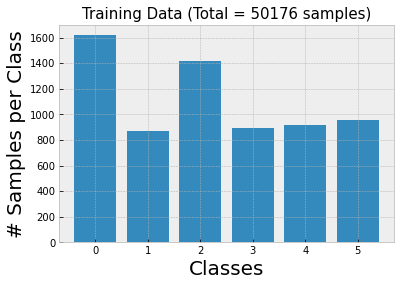

In [50]:
# Counting number samples per class
vals, counts = np.unique(t_train_full, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(6),range(6))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(X_train_full.shape[1])+' samples)',size=15);

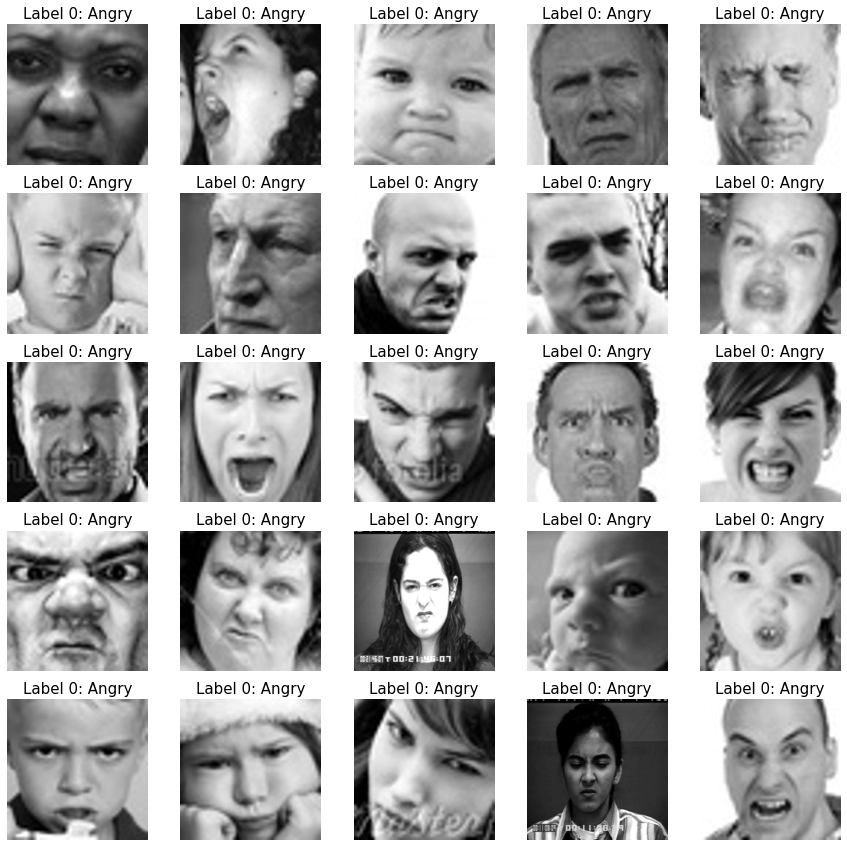

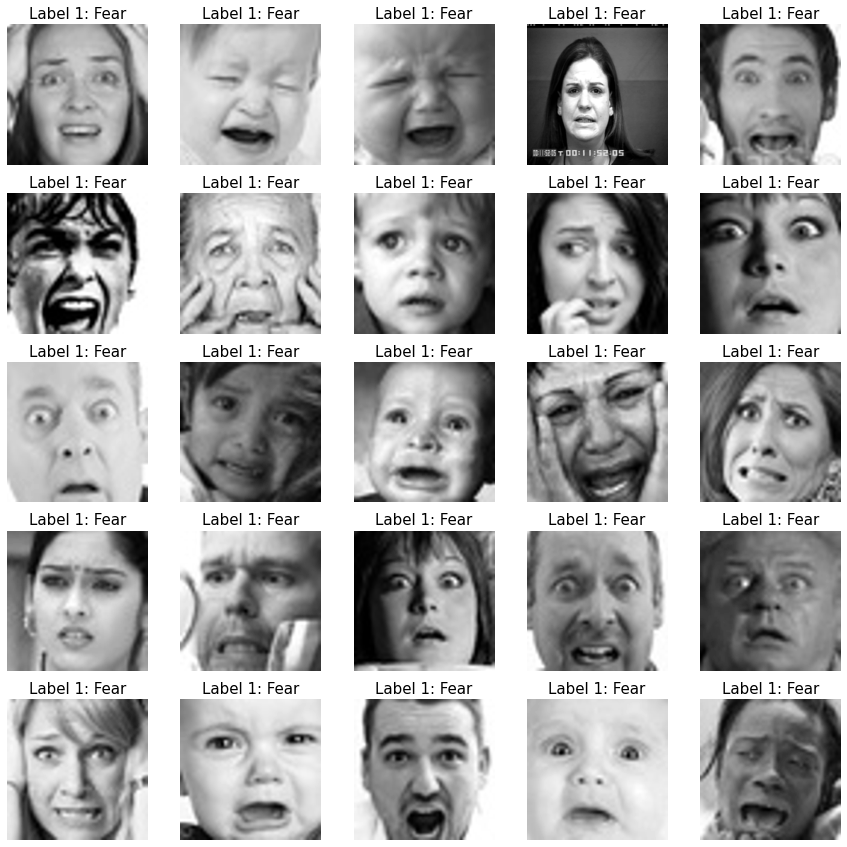

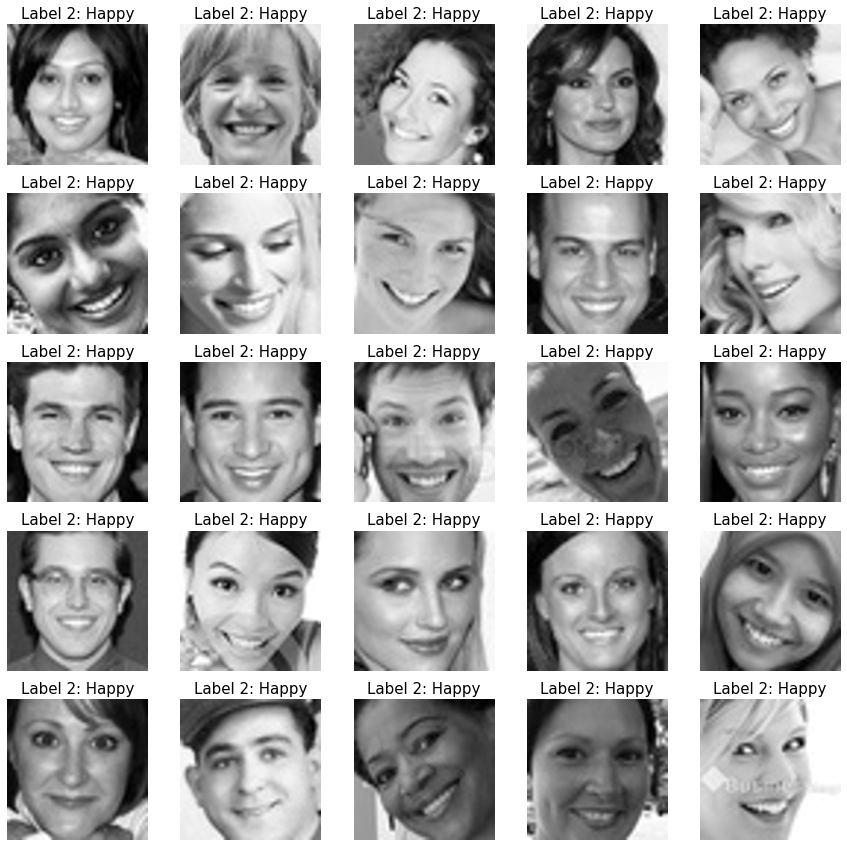

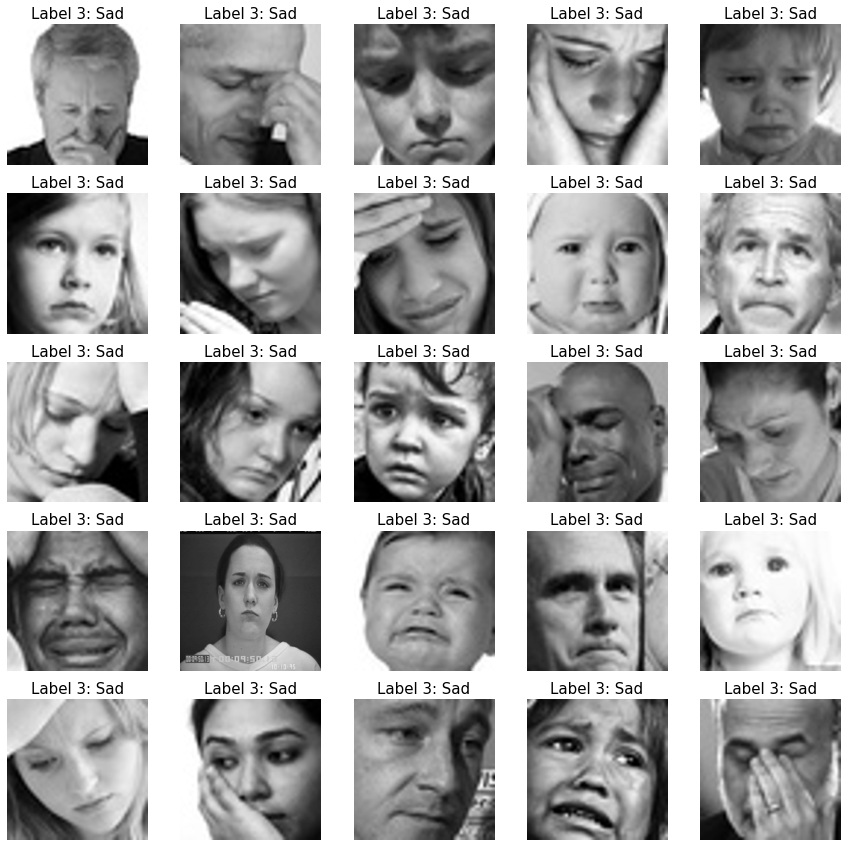

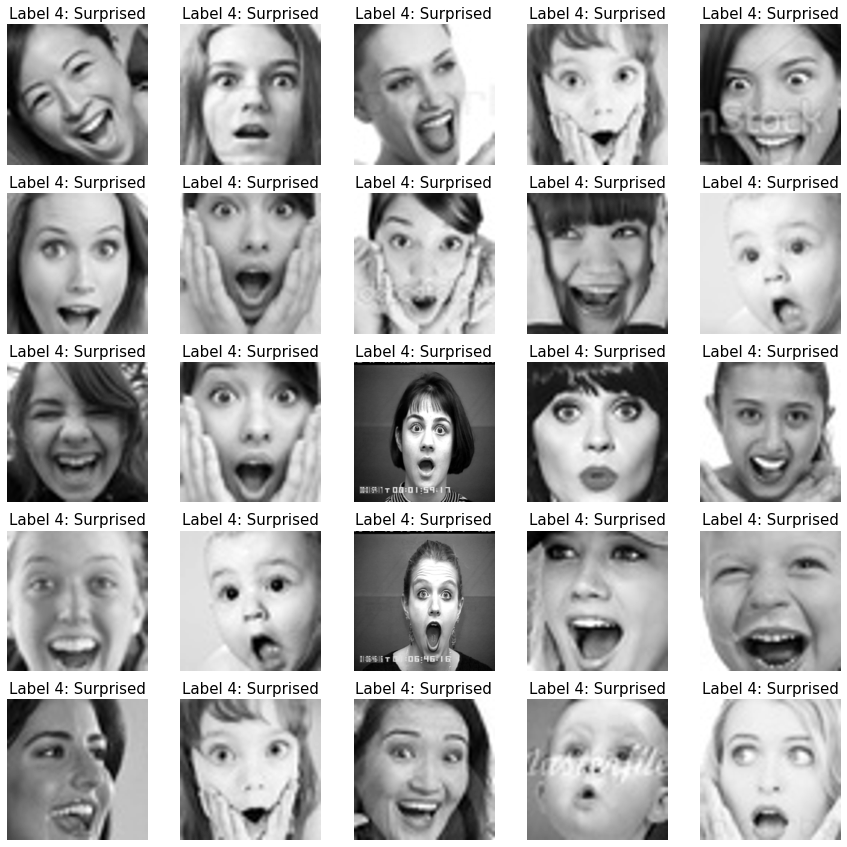

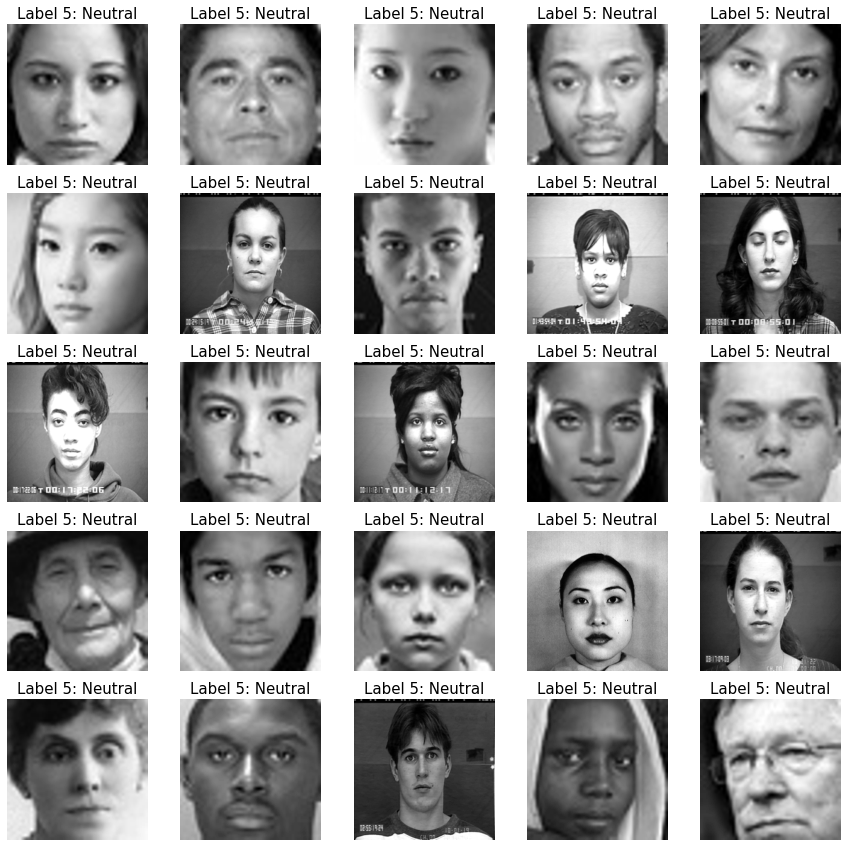

In [51]:
for i in range(0,6):
    rnd_sample = npr.permutation(np.where(t_train_full==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_train_full[rnd_sample[j]].reshape((224,224)), cmap='gray')
        label_idx = int(t_train_full[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

### Split data into training and validation sets

In [52]:
from sklearn.model_selection import train_test_split
# Train and validation sets
X_train, X_val, t_train, t_val = train_test_split(X_train_full, 
                                                  t_train_full, 
                                                  shuffle=True,
                                                  stratify=t_train_full,
                                                  random_state=0,
                                                  test_size=0.3)

X_train.shape, X_val.shape, t_train.shape, t_val.shape

((4665, 50176), (2000, 50176), (4665,), (2000,))

In [53]:
del X_train_full
gc.collect()

61965

In [54]:
del t_train_full
gc.collect()

0

### Preprocess data

### Fix class imbalance

In [55]:
X_train = X_train.reshape(X_train.shape[0], 224, 224, 1)#/255.0
X_val = X_val.reshape(X_val.shape[0], 224, 224, 1)#/255.0
print(X_train.shape, X_val.shape)
print(X_train.dtype, X_val.dtype)

(4665, 224, 224, 1) (2000, 224, 224, 1)
uint8 uint8


In [56]:
# Counting number samples per class
vals, counts = np.unique(t_train, return_counts=True)
print(vals, counts)

[0 1 2 3 4 5] [1132  609  989  625  643  667]


### Data Augmentation

In [57]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the data augmentation for the minority classes
augmentation = ImageDataGenerator(rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                shear_range=0.2,
                                zoom_range=[1.5,1.5],
                                horizontal_flip=True,
                                vertical_flip=False,
                                fill_mode='nearest')
target_distribution = 3000 
augmented_images = []
augmented_labels = []

for i in range(0,6):
    class_indices = np.where(t_train == i)[0]
    num_samples = len(class_indices)
    num_augmented_samples = target_distribution - num_samples
    if num_augmented_samples > 0:
        # Randomly select samples from the class for augmentation
        np.random.seed(0)
        samples_to_augment = np.random.choice(class_indices, num_augmented_samples, replace=True)
        # Apply data augmentation to each selected sample
        for sample_index in samples_to_augment:
            image = X_train[sample_index]
            augmented_image = augmentation.random_transform(image)
            augmented_images.append(augmented_image)
            augmented_labels.append(i)


augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)
X_train = np.vstack((X_train, augmented_images))
t_train = np.hstack((t_train, augmented_labels))
print(X_train.shape, X_train.dtype)
print(t_train.shape, t_train.dtype)

(18000, 224, 224, 1) uint8
(18000,) int64


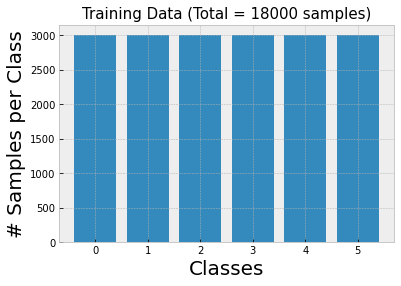

In [58]:
# Counting number samples per class
vals, counts = np.unique(t_train, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(6),range(6))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(X_train.shape[0])+' samples)',size=15);

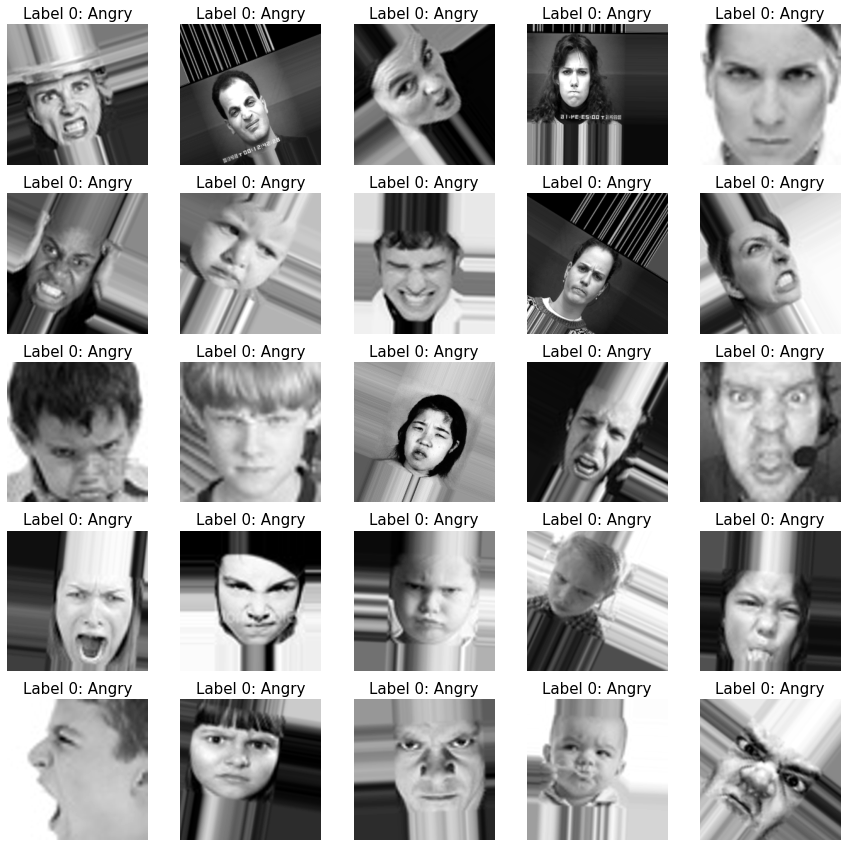

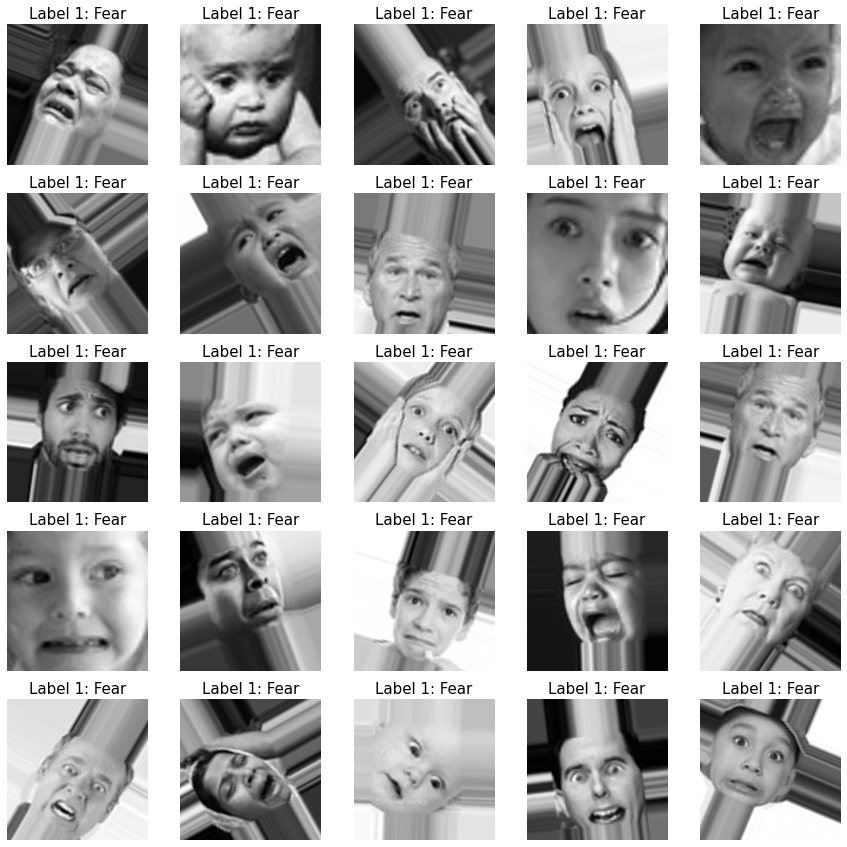

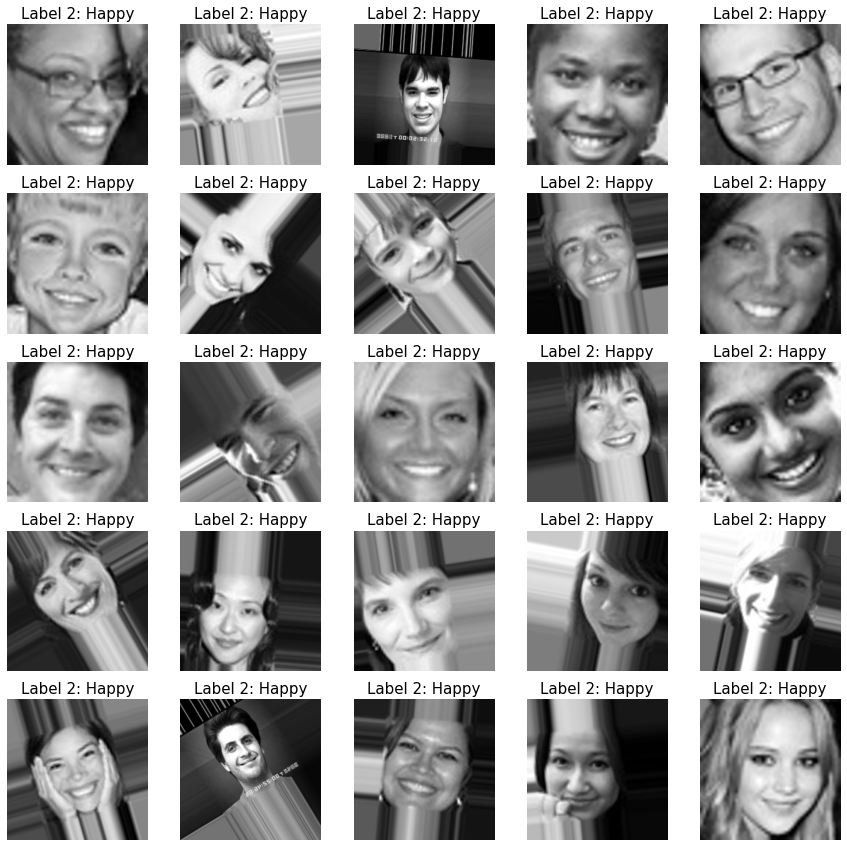

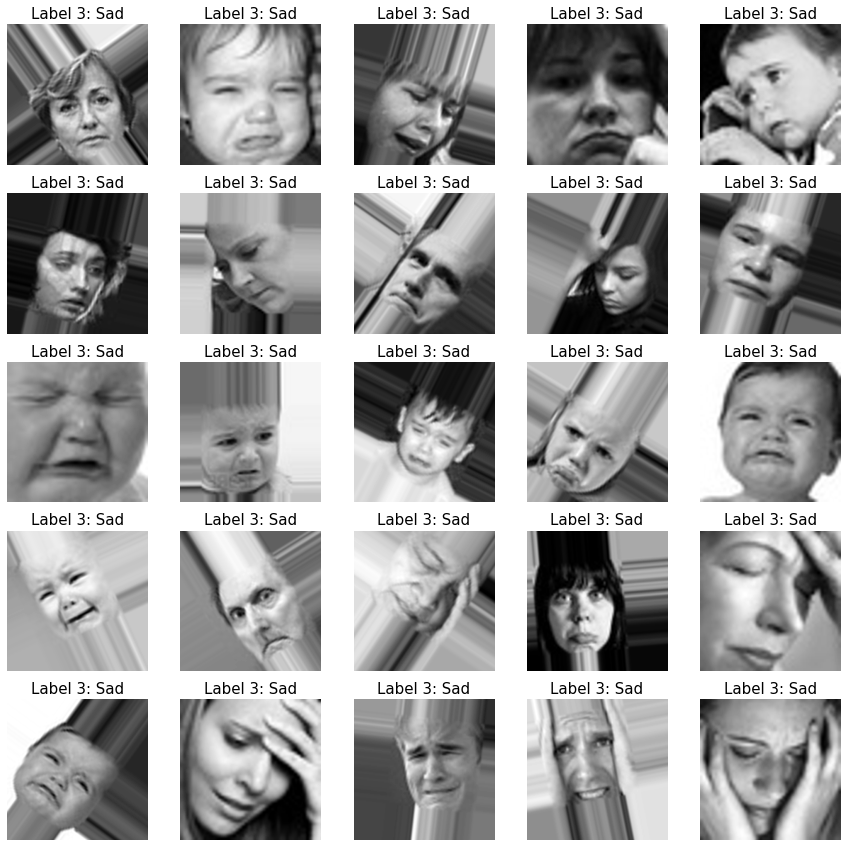

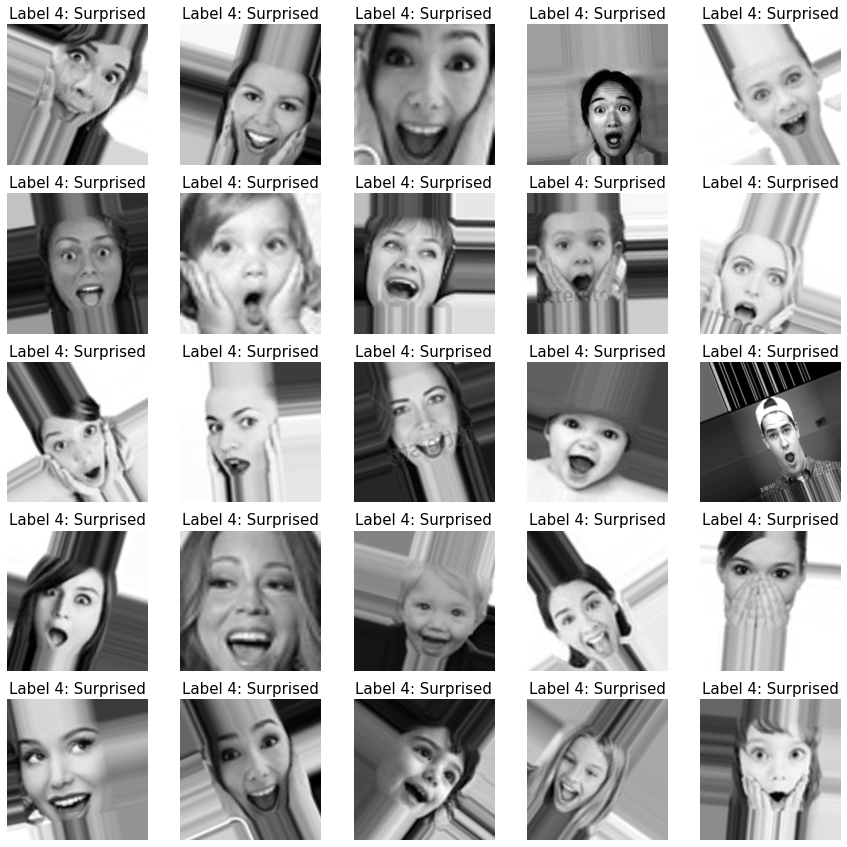

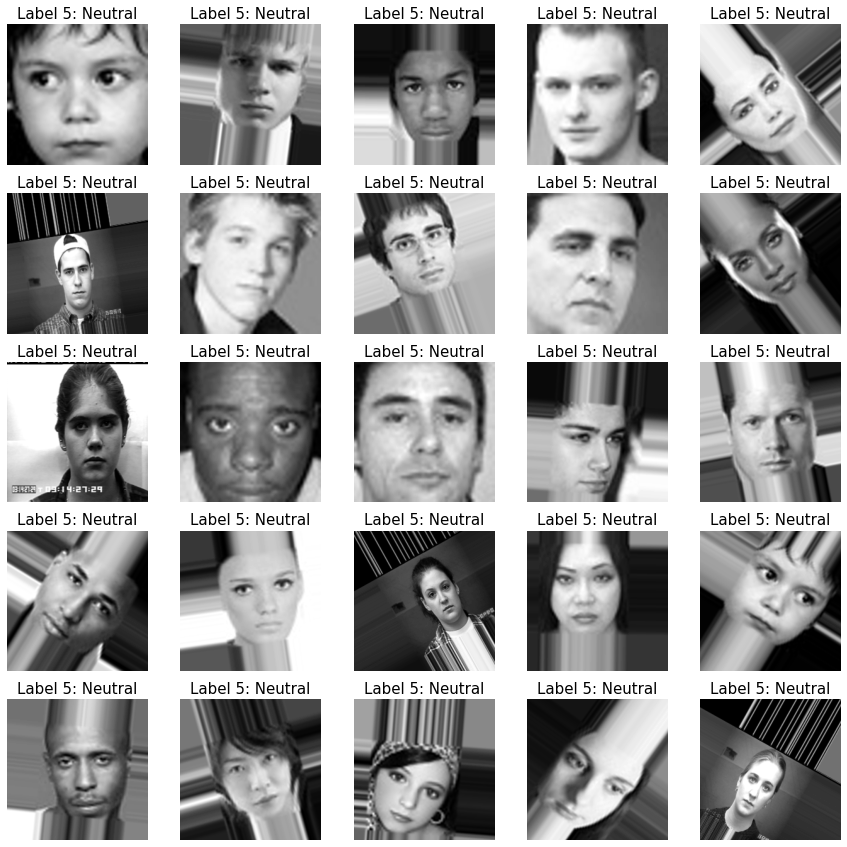

In [59]:
for i in range(0,6):
    rnd_sample = npr.permutation(np.where(t_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_train[rnd_sample[j]].reshape((224,224)), cmap='gray')
        label_idx = int(t_train[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

In [41]:
np.save("fixed_data/X_train_dataAug3", X_train, 1)
np.save("fixed_data/t_train_dataAug3", t_train, 1)

#### RGB -> grayscale (ignore)

In [97]:
import cv2
X_train = (X_train * 255).astype(np.uint8)
X_val = (X_val * 255).astype(np.uint8)

X_train_gray = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in X_train])
X_val_gray = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in X_val])

# Reshape grayscale images to (224, 224, 1)
X_train_gray = X_train_gray.reshape(X_train_gray.shape + (1,))
X_val_gray = X_val_gray.reshape(X_val_gray.shape + (1,))

# Normalize pixel values to the range [0, 1]
X_train_gray = X_train_gray / 255.0
X_val_gray = X_val_gray / 255.0
print(X_train_gray.shape)
print(X_val_gray.shape)

(36000, 224, 224, 1)
(5365, 224, 224, 1)


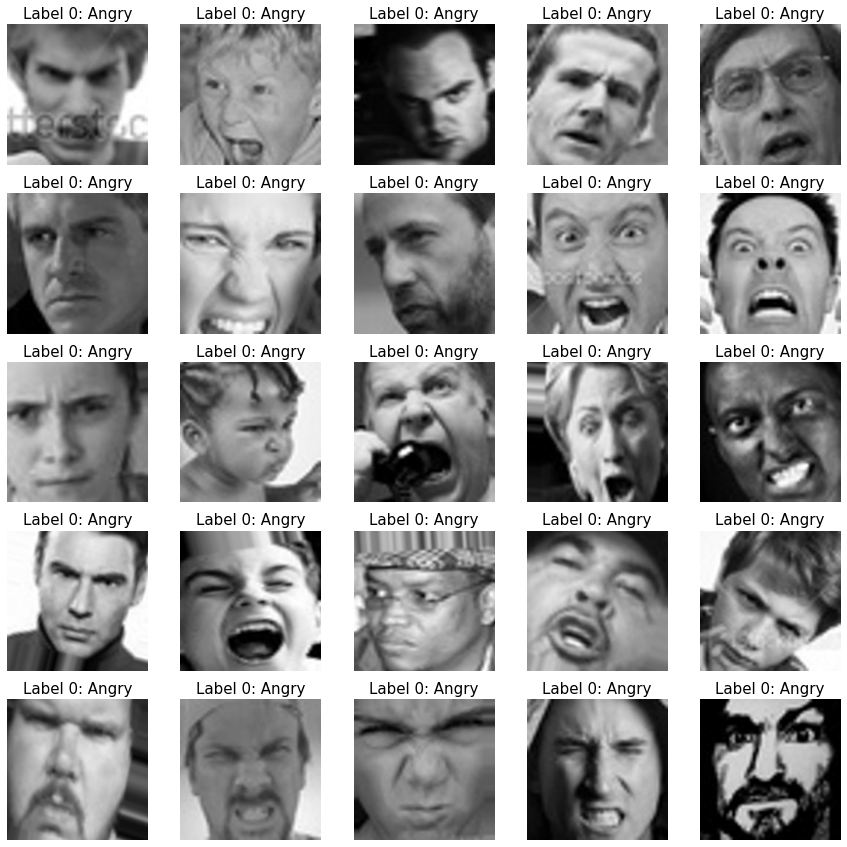

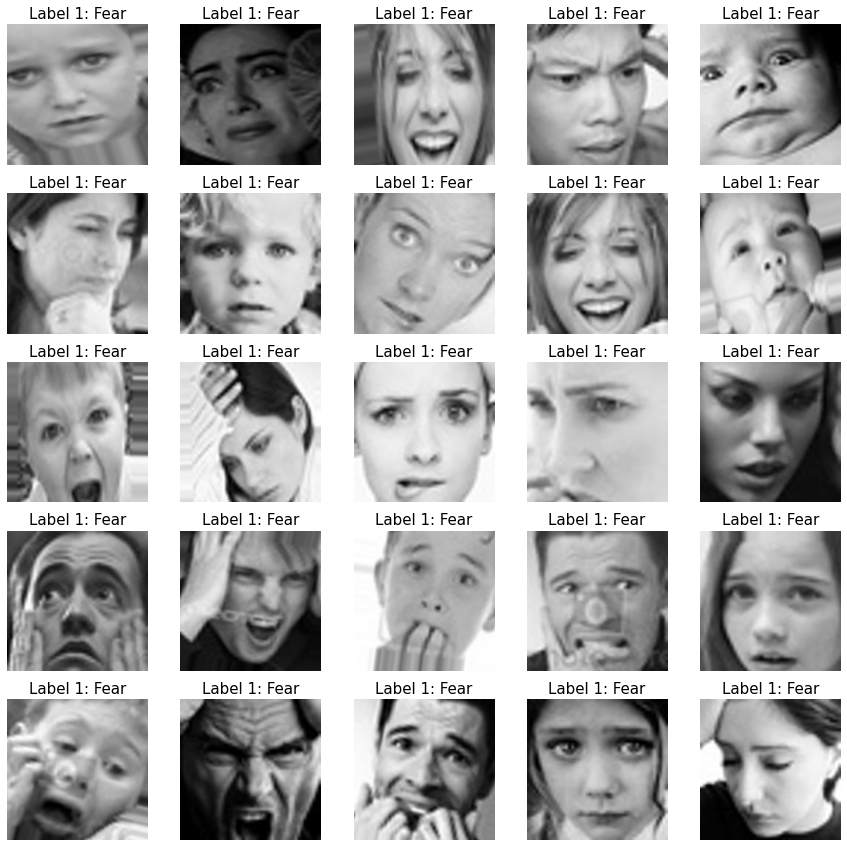

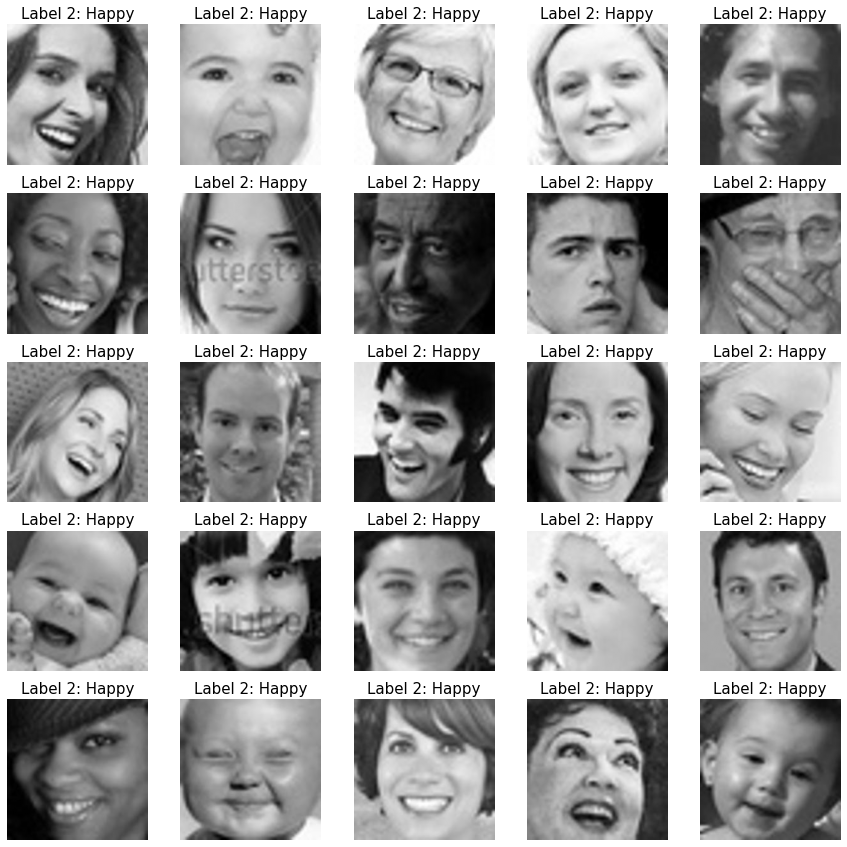

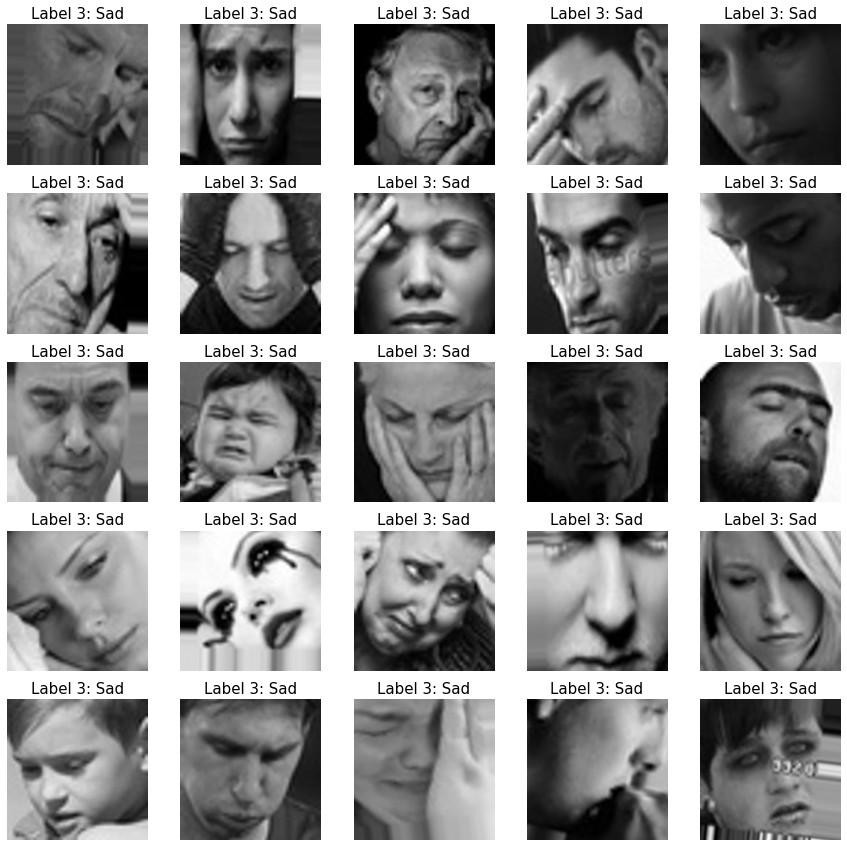

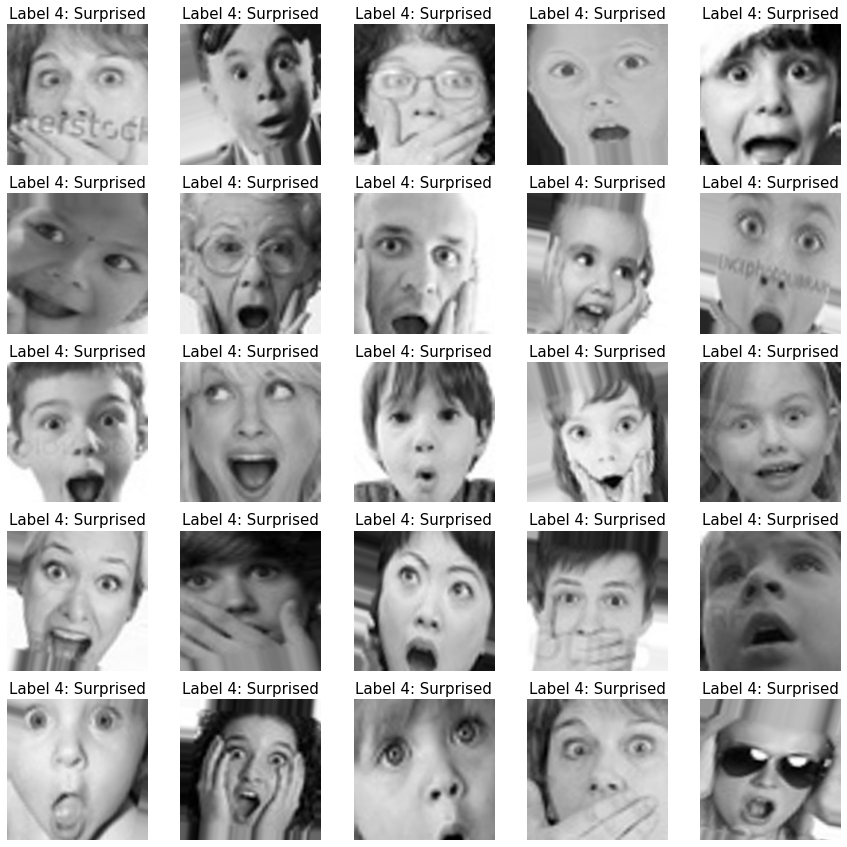

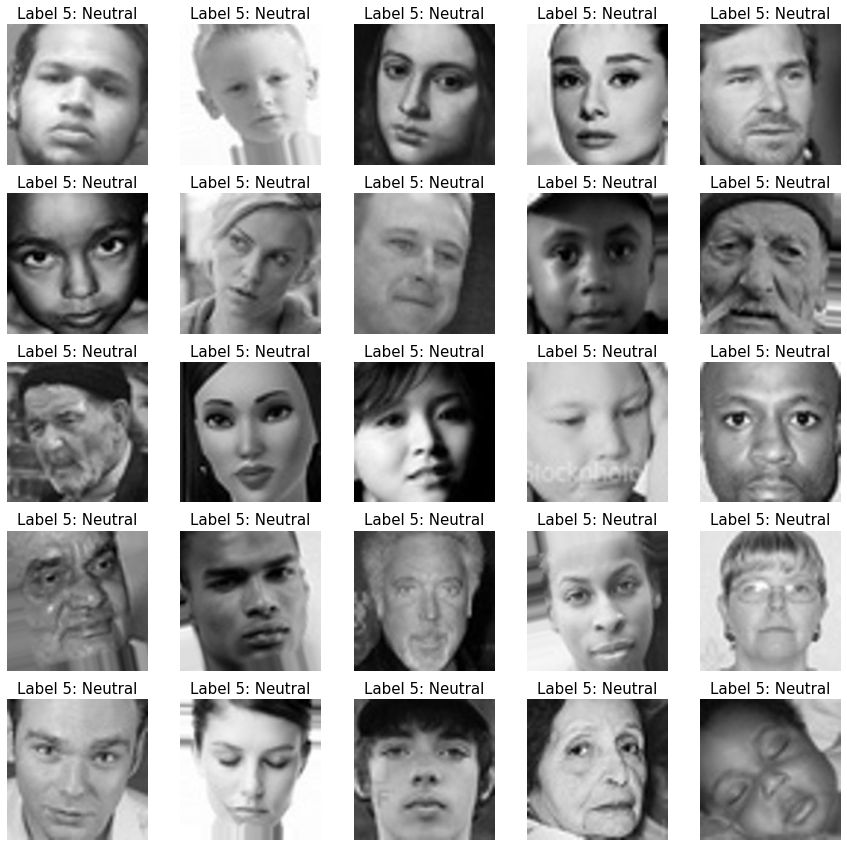

In [132]:
for i in range(0,6):
    rnd_sample = npr.permutation(np.where(t_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_train[rnd_sample[j]])
        label_idx = int(t_train[rnd_sample[j]])
        plt.axis('off');plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
    plt.show()
    print('\n\n')

# Model 1

In [90]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.MobileNetV2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)

In [91]:
# Make all layers of pre-trained model untrainable
base_model.trainable = True

In [94]:
inputs = keras.Input(shape=(224,224,1))
#x = keras.Sequential([keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
#                     keras.layers.experimental.preprocessing.RandomRotation(0.2)])(inputs)
#x = keras.applications.mobilenet_v2.preprocess_input(inputs)
x = tf.image.grayscale_to_rgb(inputs)
x = base_model(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
outputs = keras.layers.Dense(6, activation='softmax', 
                             kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
#,beta_1=0.9, beta_2=0.999
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])

Epoch 1/300
282/282 [==============================] - 68s 229ms/step - loss: 0.9833 - accuracy: 0.6717 - val_loss: 1.8182 - val_accuracy: 0.5050 - lr: 1.0000e-04
Epoch 2/300
282/282 [==============================] - 64s 226ms/step - loss: 0.3910 - accuracy: 0.9032 - val_loss: 1.1956 - val_accuracy: 0.6725 - lr: 1.0000e-04
Epoch 3/300
282/282 [==============================] - 64s 228ms/step - loss: 0.2136 - accuracy: 0.9670 - val_loss: 0.9823 - val_accuracy: 0.7445 - lr: 1.0000e-04
Epoch 4/300
282/282 [==============================] - 64s 228ms/step - loss: 0.1497 - accuracy: 0.9866 - val_loss: 0.9489 - val_accuracy: 0.7660 - lr: 1.0000e-04
Epoch 5/300
282/282 [==============================] - 65s 229ms/step - loss: 0.1257 - accuracy: 0.9916 - val_loss: 0.8260 - val_accuracy: 0.7960 - lr: 1.0000e-04
Epoch 6/300
282/282 [==============================] - 64s 227ms/step - loss: 0.1192 - accuracy: 0.9894 - val_loss: 0.8347 - val_accuracy: 0.7985 - lr: 1.0000e-04
Epoch 7/300
282/282 [=

KeyboardInterrupt: 

In [25]:
history = model.fit(X_train, t_train, batch_size=32, epochs=50, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/50
750/750 [==============================] - 98s 127ms/step - loss: 1.9973 - accuracy: 0.2828 - val_loss: 2.2106 - val_accuracy: 0.1324
Epoch 2/50
750/750 [==============================] - 93s 123ms/step - loss: 1.9395 - accuracy: 0.3217 - val_loss: 1.9381 - val_accuracy: 0.3694
Epoch 3/50
750/750 [==============================] - 92s 122ms/step - loss: 1.8906 - accuracy: 0.3566 - val_loss: 1.8606 - val_accuracy: 0.4111
Epoch 4/50
750/750 [==============================] - 93s 124ms/step - loss: 1.8368 - accuracy: 0.3925 - val_loss: 1.8157 - val_accuracy: 0.4267
Epoch 5/50
750/750 [==============================] - 92s 122ms/step - loss: 1.7909 - accuracy: 0.4183 - val_loss: 1.7762 - val_accuracy: 0.4386
Epoch 6/50
750/750 [==============================] - 92s 122ms/step - loss: 1.7443 - accuracy: 0.4401 - val_loss: 1.7372 - val_accuracy: 0.4534
Epoch 7/50
750/750 [==============================] - 93s 123ms/step - loss: 1.7065 - accuracy: 0.4612 - val_loss: 1.6986 - val_ac

In [ ]:
history = model.fit(X_train, t_train, batch_size=32, epochs=80, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=15)])

In [95]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 9ms/step - loss: 0.3684 - accuracy: 0.9100


[0.36844974756240845, 0.9100000262260437]

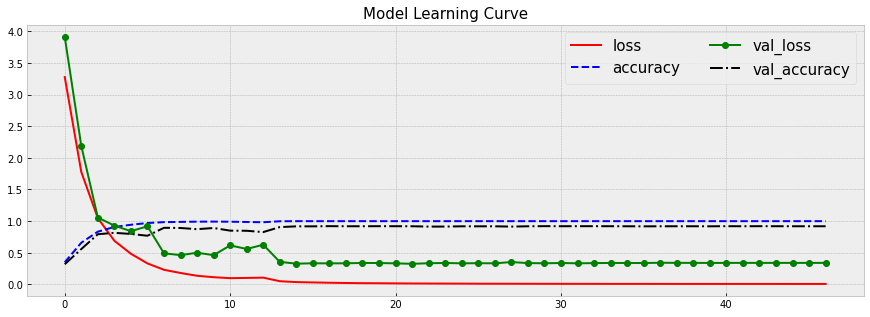

In [97]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);    

In [98]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       1.00      1.00      1.00      3000
        Fear       1.00      1.00      1.00      3000
       Happy       1.00      1.00      1.00      3000
         Sad       1.00      1.00      1.00      3000
   Surprised       1.00      1.00      1.00      3000
     Neutral       1.00      1.00      1.00      3000

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



In [99]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.92      0.93      0.92       486
        Fear       0.87      0.83      0.85       261
       Happy       0.94      0.98      0.96       424
         Sad       0.84      0.83      0.84       268
   Surprised       0.93      0.93      0.93       275
     Neutral       0.93      0.90      0.92       286

    accuracy                           0.91      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.91      0.91      0.91      2000



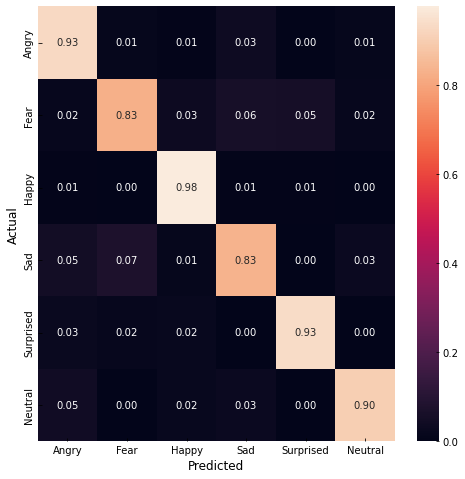

In [100]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

### Create tensorflow lite model

In [101]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model1_rr.tflite', 'wb') as f:
  f.write(tflite_model)

In [102]:
# Save the model as h5 file
model.save('models/model1_rr.h5')

# Model 2

In [ ]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.MobileNetV2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)

In [ ]:
# Make all layers of pre-trained model untrainable
base_model.trainable = True

In [37]:
inputs = keras.Input(shape=(224,224,1))
x = keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
outputs = keras.layers.Dense(7, activation='softmax', 
                             kernel_regularizer=keras.regularizers.l2(1e-3))(x)

model = keras.Model(inputs, outputs=outputs)
#,beta_1=0.9, beta_2=0.999
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-6),
             metrics=['accuracy'])

In [ ]:
history = model.fit(X_train, t_train, batch_size=32, epochs=200, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=10)])

In [21]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

188/188 [==============================] - 2s 11ms/step - loss: 1.1345 - accuracy: 0.5859


[1.1344956159591675, 0.5859310030937195]

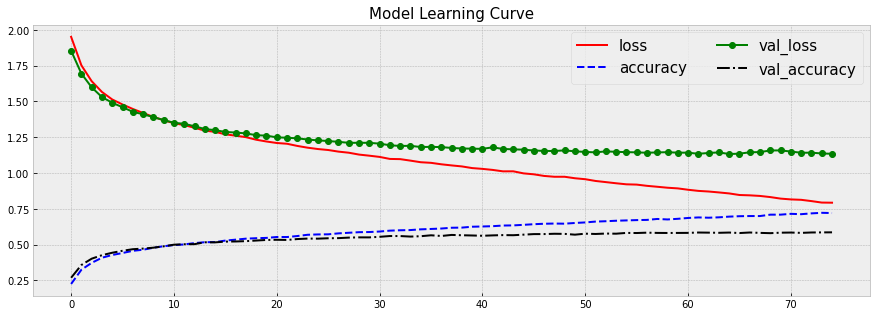

In [22]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [23]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

 Disapproval       0.85      0.25      0.39       504
       Angry       0.72      0.72      0.72      3236
        Fear       0.73      0.62      0.67      3277
       Happy       0.87      0.93      0.90      6361
         Sad       0.69      0.72      0.70      3933
   Surprised       0.84      0.80      0.82      2723
     Neutral       0.72      0.80      0.76      3961

    accuracy                           0.77     23995
   macro avg       0.77      0.69      0.71     23995
weighted avg       0.77      0.77      0.77     23995



In [24]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

 Disapproval       0.71      0.10      0.17       126
       Angry       0.49      0.47      0.48       809
        Fear       0.46      0.37      0.41       819
       Happy       0.75      0.84      0.79      1591
         Sad       0.45      0.47      0.46       983
   Surprised       0.72      0.66      0.69       681
     Neutral       0.51      0.57      0.54       990

    accuracy                           0.59      5999
   macro avg       0.58      0.50      0.51      5999
weighted avg       0.58      0.59      0.58      5999



### Create tensorflow lite model

In [ ]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model2.tflite', 'wb') as f:
  f.write(tflite_model)

# Save the model as h5 file
model.save('models/model2.h5')

# Model 3

In [103]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.MobileNetV2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)

In [104]:
len(base_model.layers)

154

In [105]:
# Make some layers trainable
iter = 0
for layer in base_model.layers:
    if iter >= 50:
        layer.trainable = True
    else:
        layer.trainable = False
    iter = iter + 1

In [ ]:
train_data = tf.data.Dataset.from_tensor_slices((X_train, t_train))
train_data = train_data.shuffle(100).batch(16)
train_steps = int(tf.data.experimental.cardinality(train_data))
train_data = train_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data = tf.data.Dataset.from_tensor_slices((X_val, t_val))
val_data = val_data.batch(16)
val_steps = int(tf.data.experimental.cardinality(val_data))
val_data = val_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
print(train_data)
print(train_steps, val_steps)

In [106]:
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal")(inputs)
#x = tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomContrast(0.3)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomZoom(-0.5)(x)
#x = keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='selu')(x) #selu to reduce vanishing gradient problem
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(32, 3, padding='same', activation='selu')(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='selu')(x)
x = keras.layers.MaxPooling2D((2,2), padding='same')(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(128, activation='selu')(x)
#x = keras.layers.Dropout(0.5)(x)
outputs = keras.layers.Dense(6, activation='softmax', 
                             kernel_regularizer=keras.regularizers.l2(1e-3))(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
history = model.fit(X_train, t_train, epochs=300, batch_size=32,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=10,monitor='val_loss')])

Epoch 1/300
563/563 [==============================] - 14s 20ms/step - loss: 1.0570 - accuracy: 0.5926 - val_loss: 0.9719 - val_accuracy: 0.6650 - lr: 1.0000e-04
Epoch 2/300
563/563 [==============================] - 11s 19ms/step - loss: 0.4135 - accuracy: 0.8606 - val_loss: 0.4868 - val_accuracy: 0.8325 - lr: 1.0000e-04
Epoch 3/300
563/563 [==============================] - 11s 19ms/step - loss: 0.2157 - accuracy: 0.9299 - val_loss: 0.5194 - val_accuracy: 0.8365 - lr: 1.0000e-04
Epoch 4/300
563/563 [==============================] - 11s 19ms/step - loss: 0.1349 - accuracy: 0.9585 - val_loss: 0.4760 - val_accuracy: 0.8610 - lr: 1.0000e-04
Epoch 5/300
563/563 [==============================] - 11s 19ms/step - loss: 0.1038 - accuracy: 0.9686 - val_loss: 0.7329 - val_accuracy: 0.8080 - lr: 1.0000e-04
Epoch 6/300
563/563 [==============================] - 11s 19ms/step - loss: 0.0851 - accuracy: 0.9753 - val_loss: 0.4785 - val_accuracy: 0.8690 - lr: 1.0000e-04
Epoch 7/300
563/563 [=======

In [18]:
history = model.fit(X_train, t_train, batch_size=32, epochs=200, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/200
750/750 [==============================] - 24s 29ms/step - loss: 2.0350 - accuracy: 0.1551 - val_loss: 1.9613 - val_accuracy: 0.1744
Epoch 2/200
750/750 [==============================] - 18s 25ms/step - loss: 2.0075 - accuracy: 0.1632 - val_loss: 1.9443 - val_accuracy: 0.1837
Epoch 3/200
750/750 [==============================] - 18s 25ms/step - loss: 1.9900 - accuracy: 0.1702 - val_loss: 1.9301 - val_accuracy: 0.1974
Epoch 4/200
750/750 [==============================] - 18s 24ms/step - loss: 1.9744 - accuracy: 0.1840 - val_loss: 1.9172 - val_accuracy: 0.2092
Epoch 5/200
750/750 [==============================] - 18s 25ms/step - loss: 1.9620 - accuracy: 0.1874 - val_loss: 1.9072 - val_accuracy: 0.2185
Epoch 6/200
750/750 [==============================] - 18s 24ms/step - loss: 1.9473 - accuracy: 0.1957 - val_loss: 1.8986 - val_accuracy: 0.2262
Epoch 7/200
750/750 [==============================] - 18s 24ms/step - loss: 1.9384 - accuracy: 0.2006 - val_loss: 1.8917 - val_ac

In [21]:
model.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             optimizer=keras.optimizers.Adam(learning_rate=5e-7),
             metrics=['accuracy'])
history = model.fit(train_data, 
                    validation_data=(val_data),
                    epochs=300,
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/300


/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


572/572 [==============================] - 32s 39ms/step - loss: 1.8133 - accuracy: 0.2685 - val_loss: 1.7656 - val_accuracy: 0.2950
Epoch 2/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8103 - accuracy: 0.2712 - val_loss: 1.7644 - val_accuracy: 0.2972
Epoch 3/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8133 - accuracy: 0.2688 - val_loss: 1.7626 - val_accuracy: 0.2979
Epoch 4/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8121 - accuracy: 0.2713 - val_loss: 1.7617 - val_accuracy: 0.2997
Epoch 5/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8085 - accuracy: 0.2717 - val_loss: 1.7605 - val_accuracy: 0.3007
Epoch 6/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8102 - accuracy: 0.2708 - val_loss: 1.7594 - val_accuracy: 0.3027
Epoch 7/300
572/572 [==============================] - 21s 37ms/step - loss: 1.8065 - accuracy: 0.2745 - val_loss: 1.7579 - val_accuracy: 0.30

In [26]:
history = model.fit(train_data, 
                    validation_data=(val_data),
                    epochs=300,
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5776 - accuracy: 0.3926 - val_loss: 1.4364 - val_accuracy: 0.4616
Epoch 2/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5756 - accuracy: 0.3919 - val_loss: 1.4355 - val_accuracy: 0.4619
Epoch 3/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5691 - accuracy: 0.4009 - val_loss: 1.4346 - val_accuracy: 0.4616
Epoch 4/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5698 - accuracy: 0.3996 - val_loss: 1.4343 - val_accuracy: 0.4639
Epoch 5/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5681 - accuracy: 0.3969 - val_loss: 1.4353 - val_accuracy: 0.4619
Epoch 6/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5729 - accuracy: 0.3932 - val_loss: 1.4331 - val_accuracy: 0.4636
Epoch 7/300
572/572 [==============================] - 21s 37ms/step - loss: 1.5655 - accuracy: 0.3970 - val_loss: 1.4312 - val_ac

In [27]:
history = model.fit(train_data, 
                    validation_data=(val_data),
                    epochs=800,
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4446 - accuracy: 0.4503 - val_loss: 1.3185 - val_accuracy: 0.5026
Epoch 2/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4448 - accuracy: 0.4531 - val_loss: 1.3184 - val_accuracy: 0.5044
Epoch 3/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4455 - accuracy: 0.4511 - val_loss: 1.3164 - val_accuracy: 0.5036
Epoch 4/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4466 - accuracy: 0.4497 - val_loss: 1.3167 - val_accuracy: 0.5053
Epoch 5/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4477 - accuracy: 0.4506 - val_loss: 1.3168 - val_accuracy: 0.5056
Epoch 6/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4406 - accuracy: 0.4521 - val_loss: 1.3144 - val_accuracy: 0.5058
Epoch 7/800
572/572 [==============================] - 21s 37ms/step - loss: 1.4446 - accuracy: 0.4522 - val_loss: 1.3140 - val_ac

In [107]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 10ms/step - loss: 0.4749 - accuracy: 0.9005


[0.47494378685951233, 0.9004999995231628]

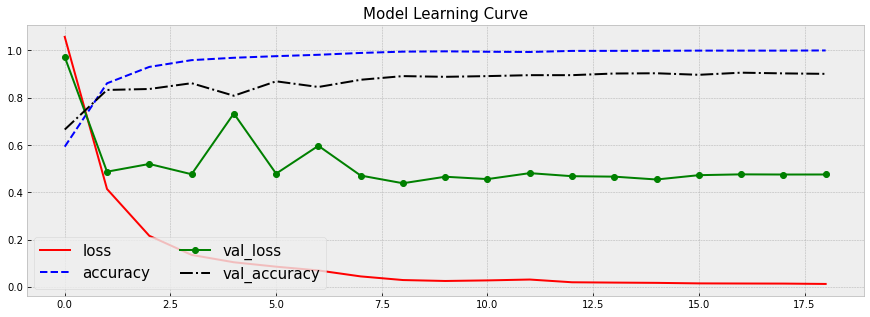

In [108]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [109]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       1.00      1.00      1.00      3000
        Fear       1.00      1.00      1.00      3000
       Happy       1.00      1.00      1.00      3000
         Sad       1.00      1.00      1.00      3000
   Surprised       1.00      1.00      1.00      3000
     Neutral       1.00      1.00      1.00      3000

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



In [110]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.91      0.89      0.90       486
        Fear       0.80      0.85      0.82       261
       Happy       0.96      0.97      0.96       424
         Sad       0.84      0.83      0.84       268
   Surprised       0.94      0.93      0.94       275
     Neutral       0.92      0.90      0.91       286

    accuracy                           0.90      2000
   macro avg       0.89      0.90      0.89      2000
weighted avg       0.90      0.90      0.90      2000



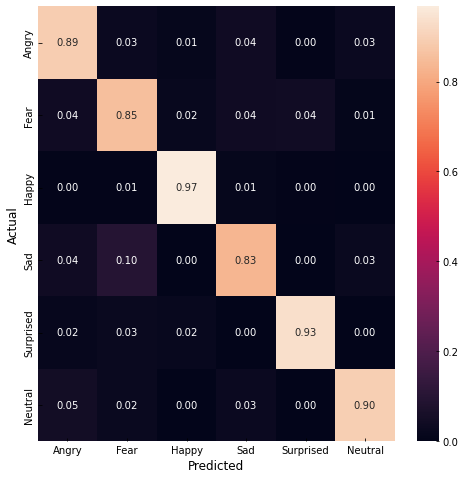

In [111]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

### Create tensorflow lite model

In [113]:
# Save the model as h5 file
model.save('models/model3_rr.h5')
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model3_rr.tflite', 'wb') as f:
  f.write(tflite_model)


loc(callsite(callsite(callsite("model_2/conv2d/Selu@__inference__wrapped_model_611376"("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py":1315:0) at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py":1280:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1080:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/convert_phase.py":216:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1150:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1170:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":761:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":775:0 at callsite("/scratch/local/13938341/ipykernel_1652524/1760243133.py":5:0 at "/a

ConverterError: /apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
<unknown>:0: error: failed while converting: 'main': 
Some ops are not supported by the native TFLite runtime, you can enable TF kernels fallback using TF Select. See instructions: https://www.tensorflow.org/lite/guide/ops_select 
TF Select ops: Selu
Details:
	tf.Selu(tensor<?x128xf32>) -> (tensor<?x128xf32>) : {device = ""}
	tf.Selu(tensor<?x1x1x128xf32>) -> (tensor<?x1x1x128xf32>) : {device = ""}
	tf.Selu(tensor<?x3x3x32xf32>) -> (tensor<?x3x3x32xf32>) : {device = ""}
	tf.Selu(tensor<?x7x7x32xf32>) -> (tensor<?x7x7x32xf32>) : {device = ""}



# Model 4


In [17]:
#reshape data to 300x300
import cv2
X_train_re = np.zeros((X_train.shape[0],300,300,3))
X_val_re = np.zeros((X_val.shape[0],300,300,3))
for i in range(X_train.shape[0]):
    X_train_re[i] = cv2.resize(X_train[i],dsize = (300,300),interpolation = cv2.INTER_CUBIC)
for i in range(X_val.shape[0]):
    X_val_re[i] = cv2.resize(X_val[i],dsize = (300,300),interpolation = cv2.INTER_CUBIC)


In [18]:
X_train_re = X_train_re.astype('uint32')
X_val_re = X_val_re.astype('uint32')

In [19]:
X_train_re.shape, X_val_re.shape, X_train.dtype, X_val_re.dtype

((23995, 300, 300, 3), (5999, 300, 300, 3), dtype('float64'), dtype('uint32'))

In [121]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.EfficientNetB7(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)

In [122]:
len(base_model.layers)

813

In [128]:
# Make some layers trainable
iter = 0
for layer in base_model.layers:
    if iter >= 100:
        layer.trainable = True
    else:
        layer.trainable = False
    iter = iter + 1

In [124]:
base_model.trainable = False

In [125]:
train_data = tf.data.Dataset.from_tensor_slices((X_train_re, t_train))
train_data = train_data.shuffle(100).batch(16)
train_data = train_data.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data = tf.data.Dataset.from_tensor_slices((X_val_re, t_val))
val_data = val_data.batch(16)
val_data = val_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
print(train_data)

NameError: name 'X_train_re' is not defined

In [129]:
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
# Perform data augmentation to make model more adaptable to unique data
#x = tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal")(inputs)
#x = tf.keras.layers.experimental.preprocessing.RandomContrast(0.4)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomZoom(-0.5)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomRotation(0.1)(x)
#x = tf.keras.applications.efficientnet.preprocess_input(x)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='selu')(x) #selu to reduce vanishing gradient problem
#x = keras.layers.Dropout(0.2)(x)
#x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(32, 3, padding='same', activation='selu')(x)
#x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='selu')(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(128, activation='selu')(x)
outputs = keras.layers.Dense(6, activation='softmax')(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
history = model.fit(X_train, t_train, epochs=300, batch_size=32,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=20,monitor='val_loss')])

Epoch 1/300
563/563 [==============================] - 57s 82ms/step - loss: 1.7436 - accuracy: 0.2538 - val_loss: 1.5197 - val_accuracy: 0.3995 - lr: 1.0000e-04
Epoch 2/300
563/563 [==============================] - 43s 77ms/step - loss: 1.5406 - accuracy: 0.3751 - val_loss: 1.3866 - val_accuracy: 0.4465 - lr: 1.0000e-04
Epoch 3/300
563/563 [==============================] - 44s 77ms/step - loss: 1.4633 - accuracy: 0.4126 - val_loss: 1.3358 - val_accuracy: 0.4800 - lr: 1.0000e-04
Epoch 4/300
563/563 [==============================] - 44s 77ms/step - loss: 1.4054 - accuracy: 0.4430 - val_loss: 1.3013 - val_accuracy: 0.4890 - lr: 1.0000e-04
Epoch 5/300
563/563 [==============================] - 44s 77ms/step - loss: 1.3615 - accuracy: 0.4616 - val_loss: 1.2264 - val_accuracy: 0.5170 - lr: 1.0000e-04
Epoch 6/300
563/563 [==============================] - 44s 77ms/step - loss: 1.3224 - accuracy: 0.4867 - val_loss: 1.1655 - val_accuracy: 0.5595 - lr: 1.0000e-04
Epoch 7/300
563/563 [=======

In [130]:
model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_7  (None, 224, 224, 3)      0         
  (TFOpLambda)                                                   
                                                                 
 efficientnetb7 (Functional)  (None, 7, 7, 2560)       64097687  
                                                                 
 conv2d_15 (Conv2D)          (None, 7, 7, 32)          81952     
                                                                 
 conv2d_16 (Conv2D)          (None, 7, 7, 32)          9248      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 3, 3, 32)         0         
 g2D)                                                      

In [26]:
history = model.fit(train_data, 
                    validation_data=(val_data),
                    epochs=300,
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/300


2023-09-21 12:31:00.891493: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2023-09-21 12:31:01.643084: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-21 12:31:01.644592: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-21 12:31:01.644605: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2023-09-21 12:31:01.645910: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-21 12:31:01.645952: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-09-21 12:31:03.134158: I tensorflow/stream_executor/cuda/c

1500/1500 [==============================] - 175s 104ms/step - loss: 1.8483 - accuracy: 0.2505 - val_loss: 1.8208 - val_accuracy: 0.2652
Epoch 2/300
1500/1500 [==============================] - 153s 102ms/step - loss: 1.8277 - accuracy: 0.2614 - val_loss: 1.8228 - val_accuracy: 0.2652


KeyboardInterrupt: 

In [17]:
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=5e-7),
             metrics=['accuracy'])

history = model.fit(X_train_re, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val_re, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/300


2023-09-21 11:25:41.302237: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2023-09-21 11:25:44.925471: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


750/750 [==============================] - 155s 185ms/step - loss: 1.9339 - accuracy: 0.1726 - val_loss: 1.8298 - val_accuracy: 0.2652
Epoch 2/300
750/750 [==============================] - 129s 172ms/step - loss: 1.8780 - accuracy: 0.2120 - val_loss: 1.8259 - val_accuracy: 0.2652
Epoch 3/300
750/750 [==============================] - 129s 172ms/step - loss: 1.8666 - accuracy: 0.2290 - val_loss: 1.8244 - val_accuracy: 0.2652
Epoch 4/300
750/750 [==============================] - 129s 172ms/step - loss: 1.8587 - accuracy: 0.2321 - val_loss: 1.8217 - val_accuracy: 0.2652
Epoch 5/300
 26/750 [>.............................] - ETA: 1:45 - loss: 1.8434 - accuracy: 0.2356

KeyboardInterrupt: 

In [132]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 4s 67ms/step - loss: 0.9282 - accuracy: 0.6620


[0.9282195568084717, 0.6620000004768372]

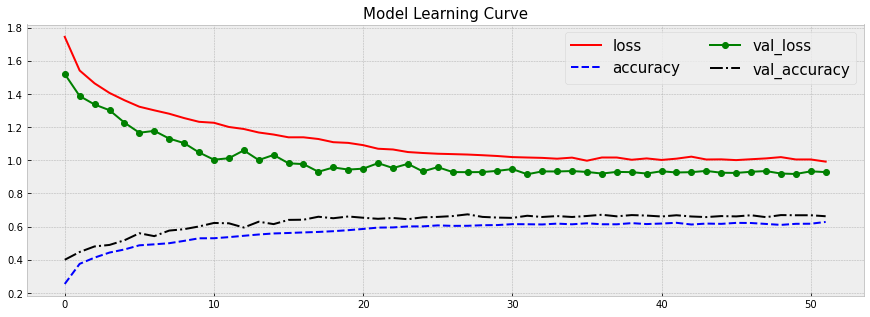

In [133]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);  

In [135]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.62      0.65      0.63      3000
        Fear       0.68      0.59      0.63      3000
       Happy       0.74      0.66      0.70      3000
         Sad       0.63      0.62      0.62      3000
   Surprised       0.83      0.63      0.72      3000
     Neutral       0.59      0.85      0.69      3000

    accuracy                           0.67     18000
   macro avg       0.68      0.67      0.67     18000
weighted avg       0.68      0.67      0.67     18000



In [136]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))


              precision    recall  f1-score   support

       Angry       0.64      0.72      0.68       486
        Fear       0.59      0.57      0.58       261
       Happy       0.81      0.75      0.78       424
         Sad       0.59      0.47      0.52       268
   Surprised       0.84      0.59      0.69       275
     Neutral       0.54      0.77      0.64       286

    accuracy                           0.66      2000
   macro avg       0.67      0.64      0.65      2000
weighted avg       0.68      0.66      0.66      2000



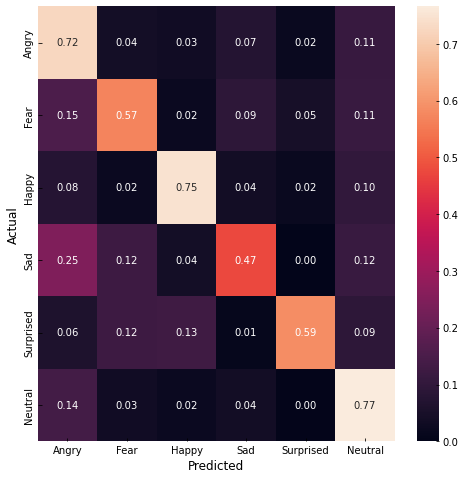

In [137]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [138]:
# Save the model as h5 file
model.save('models/model4_rr.h5')
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model4_rr.tflite', 'wb') as f:
  f.write(tflite_model)


loc(callsite(callsite(callsite("model_6/conv2d_15/Selu@__inference__wrapped_model_972426"("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py":1315:0) at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py":1280:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1080:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/convert_phase.py":216:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1150:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":1170:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":761:0 at callsite("/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/lite/python/lite.py":775:0 at callsite("/scratch/local/13938341/ipykernel_1652524/2760782999.py":5:0 at 

ConverterError: /apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: error: 'tf.Selu' op is neither a custom op nor a flex op
<unknown>:0: note: loc("StatefulPartitionedCall"): called from
/apps/tensorflow/2.7.0/lib/python3.9/site-packages/tensorflow/python/saved_model/save.py:1315:0: note: Error code: ERROR_NEEDS_FLEX_OPS
<unknown>:0: error: failed while converting: 'main': 
Some ops are not supported by the native TFLite runtime, you can enable TF kernels fallback using TF Select. See instructions: https://www.tensorflow.org/lite/guide/ops_select 
TF Select ops: Selu
Details:
	tf.Selu(tensor<?x128xf32>) -> (tensor<?x128xf32>) : {device = ""}
	tf.Selu(tensor<?x3x3x128xf32>) -> (tensor<?x3x3x128xf32>) : {device = ""}
	tf.Selu(tensor<?x7x7x32xf32>) -> (tensor<?x7x7x32xf32>) : {device = ""}



# Model 5

In [139]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.MobileNetV2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
len(base_model.layers)
base_model.trainable = True

In [ ]:
# Make some layers trainable
iter = 0
for layer in base_model.layers:
    if iter >= 5:
        layer.trainable = True
    else:
        layer.trainable = False
    iter = iter + 1

In [140]:
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
# Perform data augmentation to make model more adaptable to unique data
#x = tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal")(inputs)
#x = tf.keras.layers.experimental.preprocessing.RandomContrast(0.4)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomZoom(-0.5)(x)
#x = tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)(x)
#x = keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='relu')(x)
#x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(32, 3, padding='same', activation='relu')(x)
#x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='relu')(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
#x = keras.layers.Flatten()(x)
#x = keras.layers.Dense(128, activation='selu')(x)
outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
#,beta_1=0.9, beta_2=0.999
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])
# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
history = model.fit(X_train, t_train, epochs=300, batch_size=32,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=20,monitor='val_loss')])

Epoch 1/300
563/563 [==============================] - 70s 120ms/step - loss: 1.0864 - accuracy: 0.6127 - val_loss: 1.5112 - val_accuracy: 0.5115 - lr: 1.0000e-04
Epoch 2/300
563/563 [==============================] - 67s 120ms/step - loss: 0.4205 - accuracy: 0.8818 - val_loss: 1.0071 - val_accuracy: 0.6650 - lr: 1.0000e-04
Epoch 3/300
563/563 [==============================] - 67s 119ms/step - loss: 0.2390 - accuracy: 0.9432 - val_loss: 0.9787 - val_accuracy: 0.7220 - lr: 1.0000e-04
Epoch 4/300
563/563 [==============================] - 67s 119ms/step - loss: 0.1698 - accuracy: 0.9651 - val_loss: 0.9825 - val_accuracy: 0.7405 - lr: 1.0000e-04
Epoch 5/300
563/563 [==============================] - 67s 119ms/step - loss: 0.1330 - accuracy: 0.9746 - val_loss: 0.7723 - val_accuracy: 0.8290 - lr: 1.0000e-04
Epoch 6/300
563/563 [==============================] - 67s 120ms/step - loss: 0.1161 - accuracy: 0.9785 - val_loss: 0.7133 - val_accuracy: 0.8220 - lr: 1.0000e-04
Epoch 7/300
563/563 [=

In [15]:
#1e-4
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 1/500


2023-09-21 20:39:59.147069: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2023-09-21 20:40:01.029570: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


750/750 [==============================] - 66s 79ms/step - loss: 1.7897 - accuracy: 0.3408 - val_loss: 1.9863 - val_accuracy: 0.1382
Epoch 2/500
750/750 [==============================] - 55s 74ms/step - loss: 1.5563 - accuracy: 0.4438 - val_loss: 2.0652 - val_accuracy: 0.1390
Epoch 3/500
750/750 [==============================] - 55s 73ms/step - loss: 1.4392 - accuracy: 0.4831 - val_loss: 1.9388 - val_accuracy: 0.2650
Epoch 4/500
750/750 [==============================] - 56s 74ms/step - loss: 1.3650 - accuracy: 0.5125 - val_loss: 2.0587 - val_accuracy: 0.2612
Epoch 5/500
750/750 [==============================] - 55s 73ms/step - loss: 1.3043 - accuracy: 0.5319 - val_loss: 1.9713 - val_accuracy: 0.2845
Epoch 6/500
750/750 [==============================] - 55s 74ms/step - loss: 1.2591 - accuracy: 0.5457 - val_loss: 2.0544 - val_accuracy: 0.2979
Epoch 7/500
750/750 [==============================] - 56s 74ms/step - loss: 1.2254 - accuracy: 0.5566 - val_loss: 2.7670 - val_accuracy: 0.26

In [16]:
#1e-4 second pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-5),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 34/500
750/750 [==============================] - 61s 78ms/step - loss: 0.7509 - accuracy: 0.7302 - val_loss: 2.1733 - val_accuracy: 0.3332
Epoch 35/500
750/750 [==============================] - 55s 73ms/step - loss: 0.7314 - accuracy: 0.7334 - val_loss: 1.0104 - val_accuracy: 0.6434
Epoch 36/500
750/750 [==============================] - 54s 72ms/step - loss: 0.7293 - accuracy: 0.7334 - val_loss: 0.9639 - val_accuracy: 0.6543
Epoch 37/500
750/750 [==============================] - 54s 72ms/step - loss: 0.7171 - accuracy: 0.7399 - val_loss: 1.0339 - val_accuracy: 0.6396
Epoch 38/500
750/750 [==============================] - 54s 72ms/step - loss: 0.7055 - accuracy: 0.7448 - val_loss: 1.0365 - val_accuracy: 0.6443
Epoch 39/500
750/750 [==============================] - 54s 72ms/step - loss: 0.6966 - accuracy: 0.7488 - val_loss: 1.8836 - val_accuracy: 0.4401
Epoch 40/500
750/750 [==============================] - 54s 72ms/step - loss: 0.7001 - accuracy: 0.7468 - val_loss: 1.0112 -

In [17]:
#1e-4 third pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-6),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 51/300
750/750 [==============================] - 65s 82ms/step - loss: 0.6384 - accuracy: 0.7715 - val_loss: 0.9934 - val_accuracy: 0.6679
Epoch 52/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6437 - accuracy: 0.7673 - val_loss: 0.9534 - val_accuracy: 0.6789
Epoch 53/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6454 - accuracy: 0.7692 - val_loss: 0.9529 - val_accuracy: 0.6788
Epoch 54/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6345 - accuracy: 0.7721 - val_loss: 0.9595 - val_accuracy: 0.6796
Epoch 55/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6397 - accuracy: 0.7716 - val_loss: 0.9543 - val_accuracy: 0.6793
Epoch 56/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6431 - accuracy: 0.7698 - val_loss: 0.9574 - val_accuracy: 0.6786
Epoch 57/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6313 - accuracy: 0.7760 - val_loss: 0.9561 -

In [18]:
#1e-4 fourth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 68/300
750/750 [==============================] - 62s 80ms/step - loss: 0.6347 - accuracy: 0.7695 - val_loss: 0.9604 - val_accuracy: 0.6793
Epoch 69/300
750/750 [==============================] - 56s 75ms/step - loss: 0.6311 - accuracy: 0.7734 - val_loss: 0.9596 - val_accuracy: 0.6809
Epoch 70/300
750/750 [==============================] - 56s 75ms/step - loss: 0.6298 - accuracy: 0.7757 - val_loss: 0.9591 - val_accuracy: 0.6806
Epoch 71/300
750/750 [==============================] - 56s 75ms/step - loss: 0.6348 - accuracy: 0.7749 - val_loss: 0.9596 - val_accuracy: 0.6809
Epoch 72/300
750/750 [==============================] - 56s 74ms/step - loss: 0.6284 - accuracy: 0.7750 - val_loss: 0.9592 - val_accuracy: 0.6809
Epoch 73/300
750/750 [==============================] - 56s 74ms/step - loss: 0.6314 - accuracy: 0.7727 - val_loss: 0.9589 - val_accuracy: 0.6816
Epoch 74/300
750/750 [==============================] - 56s 75ms/step - loss: 0.6307 - accuracy: 0.7756 - val_loss: 0.9586 -

In [19]:
#1e-4 fifth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=5e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=20,
                                                            monitor='val_loss')])

Epoch 107/300
750/750 [==============================] - 65s 81ms/step - loss: 0.6290 - accuracy: 0.7751 - val_loss: 0.9578 - val_accuracy: 0.6781
Epoch 108/300
750/750 [==============================] - 57s 77ms/step - loss: 0.6362 - accuracy: 0.7696 - val_loss: 0.9572 - val_accuracy: 0.6771
Epoch 109/300
750/750 [==============================] - 58s 77ms/step - loss: 0.6283 - accuracy: 0.7742 - val_loss: 0.9579 - val_accuracy: 0.6813
Epoch 110/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6250 - accuracy: 0.7781 - val_loss: 0.9580 - val_accuracy: 0.6799
Epoch 111/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6290 - accuracy: 0.7747 - val_loss: 0.9607 - val_accuracy: 0.6808
Epoch 112/300
750/750 [==============================] - 56s 75ms/step - loss: 0.6303 - accuracy: 0.7731 - val_loss: 0.9591 - val_accuracy: 0.6799
Epoch 113/300
750/750 [==============================] - 57s 76ms/step - loss: 0.6294 - accuracy: 0.7728 - val_loss: 0

In [27]:
#relu first pass
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 1/300
750/750 [==============================] - 64s 81ms/step - loss: 1.1290 - accuracy: 0.6286 - val_loss: 3.6400 - val_accuracy: 0.1650
Epoch 2/300
750/750 [==============================] - 56s 75ms/step - loss: 0.9450 - accuracy: 0.6912 - val_loss: 2.6032 - val_accuracy: 0.2962
Epoch 3/300
750/750 [==============================] - 57s 76ms/step - loss: 0.8995 - accuracy: 0.7006 - val_loss: 4.5914 - val_accuracy: 0.1660
Epoch 4/300
750/750 [==============================] - 57s 76ms/step - loss: 0.8705 - accuracy: 0.7069 - val_loss: 3.8486 - val_accuracy: 0.1674
Epoch 5/300
750/750 [==============================] - 57s 76ms/step - loss: 0.8570 - accuracy: 0.7106 - val_loss: 2.1806 - val_accuracy: 0.2584
Epoch 6/300
750/750 [==============================] - 57s 76ms/step - loss: 0.8301 - accuracy: 0.7161 - val_loss: 2.3446 - val_accuracy: 0.2089
Epoch 7/300
750/750 [==============================] - 57s 76ms/step - loss: 0.8140 - accuracy: 0.7188 - val_loss: 2.6943 - val_ac

In [28]:
#relu second pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-5),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 20/500
750/750 [==============================] - 66s 84ms/step - loss: 0.5946 - accuracy: 0.7926 - val_loss: 1.7565 - val_accuracy: 0.5023
Epoch 21/500
750/750 [==============================] - 57s 77ms/step - loss: 0.5662 - accuracy: 0.8013 - val_loss: 1.2466 - val_accuracy: 0.6086
Epoch 22/500
750/750 [==============================] - 57s 76ms/step - loss: 0.5479 - accuracy: 0.8091 - val_loss: 1.1551 - val_accuracy: 0.6506
Epoch 23/500
750/750 [==============================] - 57s 76ms/step - loss: 0.5400 - accuracy: 0.8123 - val_loss: 1.2770 - val_accuracy: 0.6399
Epoch 24/500
750/750 [==============================] - 57s 76ms/step - loss: 0.5247 - accuracy: 0.8158 - val_loss: 1.1944 - val_accuracy: 0.6466
Epoch 25/500
750/750 [==============================] - 57s 76ms/step - loss: 0.5194 - accuracy: 0.8210 - val_loss: 1.3185 - val_accuracy: 0.6196
Epoch 26/500
750/750 [==============================] - 58s 77ms/step - loss: 0.5191 - accuracy: 0.8215 - val_loss: 1.3028 -

In [29]:
#relu third pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-6),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 37/300
750/750 [==============================] - 64s 82ms/step - loss: 0.4626 - accuracy: 0.8396 - val_loss: 1.2332 - val_accuracy: 0.6564
Epoch 38/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4646 - accuracy: 0.8390 - val_loss: 1.2001 - val_accuracy: 0.6693
Epoch 39/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4594 - accuracy: 0.8398 - val_loss: 1.1935 - val_accuracy: 0.6684
Epoch 40/300
750/750 [==============================] - 58s 78ms/step - loss: 0.4618 - accuracy: 0.8399 - val_loss: 1.1988 - val_accuracy: 0.6679
Epoch 41/300
750/750 [==============================] - 58s 78ms/step - loss: 0.4680 - accuracy: 0.8370 - val_loss: 1.2579 - val_accuracy: 0.6616
Epoch 42/300
750/750 [==============================] - 58s 78ms/step - loss: 0.4642 - accuracy: 0.8375 - val_loss: 1.2287 - val_accuracy: 0.6653
Epoch 43/300
750/750 [==============================] - 58s 78ms/step - loss: 0.4613 - accuracy: 0.8403 - val_loss: 1.2274 -

In [30]:
#relu fourth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 54/300
750/750 [==============================] - 64s 82ms/step - loss: 0.4568 - accuracy: 0.8429 - val_loss: 1.2114 - val_accuracy: 0.6639
Epoch 55/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4582 - accuracy: 0.8416 - val_loss: 1.2083 - val_accuracy: 0.6649
Epoch 56/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4585 - accuracy: 0.8375 - val_loss: 1.2053 - val_accuracy: 0.6653
Epoch 57/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4510 - accuracy: 0.8442 - val_loss: 1.2067 - val_accuracy: 0.6639
Epoch 58/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4554 - accuracy: 0.8435 - val_loss: 1.2060 - val_accuracy: 0.6643
Epoch 59/300
750/750 [==============================] - 58s 77ms/step - loss: 0.4529 - accuracy: 0.8439 - val_loss: 1.2058 - val_accuracy: 0.6658
Epoch 60/300
750/750 [==============================] - 57s 76ms/step - loss: 0.4522 - accuracy: 0.8444 - val_loss: 1.2087 -

In [31]:
#relu fifth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=5e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=20,
                                                            monitor='val_loss')])

Epoch 71/300
750/750 [==============================] - 62s 79ms/step - loss: 0.4459 - accuracy: 0.8473 - val_loss: 1.1992 - val_accuracy: 0.6673
Epoch 72/300
750/750 [==============================] - 56s 74ms/step - loss: 0.4535 - accuracy: 0.8410 - val_loss: 1.2072 - val_accuracy: 0.6668
Epoch 73/300
750/750 [==============================] - 56s 74ms/step - loss: 0.4584 - accuracy: 0.8409 - val_loss: 1.2090 - val_accuracy: 0.6683
Epoch 74/300
750/750 [==============================] - 56s 75ms/step - loss: 0.4594 - accuracy: 0.8422 - val_loss: 1.2130 - val_accuracy: 0.6678
Epoch 75/300
750/750 [==============================] - 55s 74ms/step - loss: 0.4567 - accuracy: 0.8408 - val_loss: 1.2184 - val_accuracy: 0.6676
Epoch 76/300
750/750 [==============================] - 56s 75ms/step - loss: 0.4450 - accuracy: 0.8461 - val_loss: 1.2163 - val_accuracy: 0.6673
Epoch 77/300
750/750 [==============================] - 55s 74ms/step - loss: 0.4441 - accuracy: 0.8471 - val_loss: 1.2099 -

##### 5e-7 runs with selu

In [23]:
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/300
750/750 [==============================] - 24s 29ms/step - loss: 2.0603 - accuracy: 0.1819 - val_loss: 2.0249 - val_accuracy: 0.2482
Epoch 2/300
750/750 [==============================] - 18s 24ms/step - loss: 2.0280 - accuracy: 0.2083 - val_loss: 1.9916 - val_accuracy: 0.2635
Epoch 3/300
750/750 [==============================] - 18s 24ms/step - loss: 2.0069 - accuracy: 0.2234 - val_loss: 2.0004 - val_accuracy: 0.2572
Epoch 4/300
750/750 [==============================] - 18s 24ms/step - loss: 1.9964 - accuracy: 0.2312 - val_loss: 2.0046 - val_accuracy: 0.2065
Epoch 5/300
750/750 [==============================] - 18s 24ms/step - loss: 1.9866 - accuracy: 0.2398 - val_loss: 1.9849 - val_accuracy: 0.2222
Epoch 6/300
750/750 [==============================] - 18s 24ms/step - loss: 1.9792 - accuracy: 0.2425 - val_loss: 1.9637 - val_accuracy: 0.2590
Epoch 7/300
750/750 [==============================] - 18s 24ms/step - loss: 1.9715 - accuracy: 0.2478 - val_loss: 1.9565 - val_ac

In [24]:
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/300
750/750 [==============================] - 22s 29ms/step - loss: 1.6107 - accuracy: 0.4145 - val_loss: 1.4655 - val_accuracy: 0.4787
Epoch 2/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6083 - accuracy: 0.4119 - val_loss: 1.4650 - val_accuracy: 0.4806
Epoch 3/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6092 - accuracy: 0.4167 - val_loss: 1.4645 - val_accuracy: 0.4802
Epoch 4/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6065 - accuracy: 0.4184 - val_loss: 1.4644 - val_accuracy: 0.4786
Epoch 5/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6047 - accuracy: 0.4179 - val_loss: 1.4637 - val_accuracy: 0.4802
Epoch 6/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6104 - accuracy: 0.4127 - val_loss: 1.4625 - val_accuracy: 0.4822
Epoch 7/300
750/750 [==============================] - 18s 24ms/step - loss: 1.6016 - accuracy: 0.4199 - val_loss: 1.4620 - val_ac

In [26]:
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=10,
                                                            monitor='val_loss')])

Epoch 1/500
750/750 [==============================] - 21s 29ms/step - loss: 1.4441 - accuracy: 0.4748 - val_loss: 1.3133 - val_accuracy: 0.5289
Epoch 2/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4392 - accuracy: 0.4797 - val_loss: 1.3116 - val_accuracy: 0.5274
Epoch 3/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4439 - accuracy: 0.4753 - val_loss: 1.3117 - val_accuracy: 0.5264
Epoch 4/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4357 - accuracy: 0.4813 - val_loss: 1.3120 - val_accuracy: 0.5261
Epoch 5/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4413 - accuracy: 0.4796 - val_loss: 1.3105 - val_accuracy: 0.5303
Epoch 6/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4403 - accuracy: 0.4783 - val_loss: 1.3104 - val_accuracy: 0.5303
Epoch 7/500
750/750 [==============================] - 18s 24ms/step - loss: 1.4386 - accuracy: 0.4764 - val_loss: 1.3101 - val_ac

In [31]:
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=1e-7),
              metrics=['accuracy'])

history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 150/300
750/750 [==============================] - 21s 25ms/step - loss: 1.8295 - accuracy: 0.2484 - val_loss: 1.8171 - val_accuracy: 0.2647
Epoch 151/300
750/750 [==============================] - 15s 20ms/step - loss: 1.8080 - accuracy: 0.2588 - val_loss: 1.8042 - val_accuracy: 0.2654
Epoch 152/300
750/750 [==============================] - 15s 20ms/step - loss: 1.7964 - accuracy: 0.2631 - val_loss: 1.8229 - val_accuracy: 0.2645
Epoch 153/300
750/750 [==============================] - 15s 20ms/step - loss: 1.7804 - accuracy: 0.2722 - val_loss: 1.7776 - val_accuracy: 0.2672
Epoch 154/300
750/750 [==============================] - 15s 20ms/step - loss: 1.7633 - accuracy: 0.2861 - val_loss: 1.8545 - val_accuracy: 0.2907
Epoch 155/300
750/750 [==============================] - 15s 20ms/step - loss: 1.7551 - accuracy: 0.2880 - val_loss: 1.7682 - val_accuracy: 0.2750
Epoch 156/300
750/750 [==============================] - 15s 20ms/step - loss: 1.7388 - accuracy: 0.3003 - val_loss: 2

In [141]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 10ms/step - loss: 0.4364 - accuracy: 0.9205


[0.43640202283859253, 0.9204999804496765]

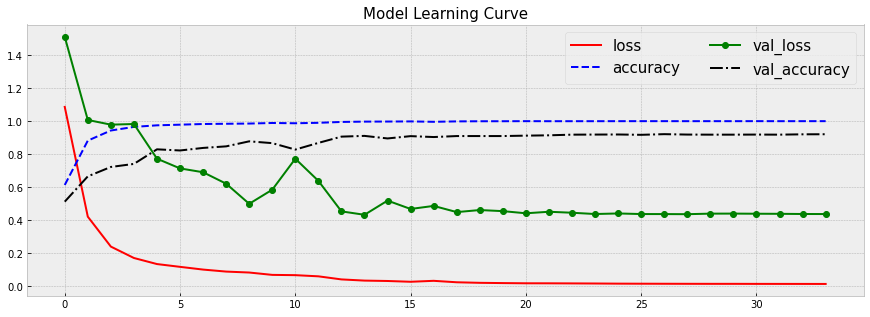

In [142]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [143]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       1.00      1.00      1.00      3000
        Fear       1.00      1.00      1.00      3000
       Happy       1.00      1.00      1.00      3000
         Sad       1.00      1.00      1.00      3000
   Surprised       1.00      1.00      1.00      3000
     Neutral       1.00      1.00      1.00      3000

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



In [144]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.92      0.93      0.93       486
        Fear       0.89      0.87      0.88       261
       Happy       0.96      0.97      0.96       424
         Sad       0.87      0.85      0.86       268
   Surprised       0.95      0.94      0.94       275
     Neutral       0.92      0.92      0.92       286

    accuracy                           0.92      2000
   macro avg       0.92      0.91      0.92      2000
weighted avg       0.92      0.92      0.92      2000



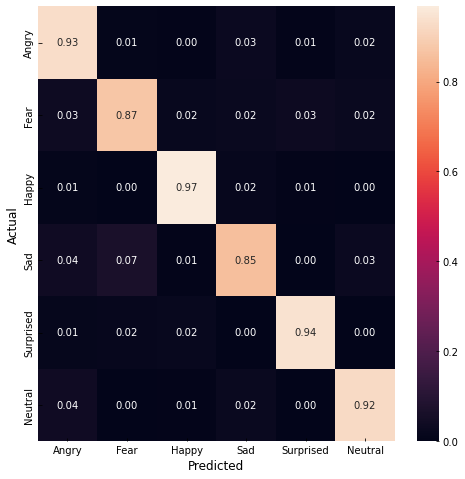

In [145]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [146]:
# Save the model as h5 file
model.save('models/model5_rr.h5')
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model5_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 6

In [147]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.ResNet152V2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
len(base_model.layers)

564

In [148]:
# Freeze the specified number of layers
for layer in base_model.layers[:100]:
    layer.trainable = False
base_model.trainable=True

In [149]:
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
#x = tf.keras.applications.nasnet.preprocess_input(x)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='relu')(x)
#x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(32, 3, padding='same', activation='relu')(x)
#x = keras.layers.Dropout(0.2)(x)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='relu')(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
#x = keras.layers.Flatten()(x)
#x = keras.layers.Dense(128, activation='selu')(x)
outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
#,beta_1=0.9, beta_2=0.999
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])
# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
history = model.fit(X_train, t_train, epochs=300, batch_size=32,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=20,monitor='val_loss')])

Epoch 1/300
563/563 [==============================] - 77s 119ms/step - loss: 0.9546 - accuracy: 0.6814 - val_loss: 1.3113 - val_accuracy: 0.5250 - lr: 1.0000e-04
Epoch 2/300
563/563 [==============================] - 65s 115ms/step - loss: 0.4017 - accuracy: 0.8986 - val_loss: 0.6033 - val_accuracy: 0.8465 - lr: 1.0000e-04
Epoch 3/300
563/563 [==============================] - 65s 115ms/step - loss: 0.2554 - accuracy: 0.9406 - val_loss: 0.4425 - val_accuracy: 0.8920 - lr: 1.0000e-04
Epoch 4/300
563/563 [==============================] - 65s 115ms/step - loss: 0.2007 - accuracy: 0.9558 - val_loss: 0.5006 - val_accuracy: 0.8750 - lr: 1.0000e-04
Epoch 5/300
563/563 [==============================] - 65s 115ms/step - loss: 0.1678 - accuracy: 0.9640 - val_loss: 0.5210 - val_accuracy: 0.8750 - lr: 1.0000e-04
Epoch 6/300
563/563 [==============================] - 65s 115ms/step - loss: 0.1332 - accuracy: 0.9733 - val_loss: 0.4205 - val_accuracy: 0.8970 - lr: 1.0000e-04
Epoch 7/300
563/563 [=

In [16]:
#1e-4
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 1/500


2023-10-06 20:02:31.507201: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2023-10-06 20:02:37.789322: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


1313/1313 [==============================] - 140s 93ms/step - loss: 1.1814 - accuracy: 0.5840 - val_loss: 1.0333 - val_accuracy: 0.6553
Epoch 2/500
1313/1313 [==============================] - 118s 90ms/step - loss: 0.7672 - accuracy: 0.7454 - val_loss: 0.9942 - val_accuracy: 0.6694
Epoch 3/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.5207 - accuracy: 0.8353 - val_loss: 0.9973 - val_accuracy: 0.6791
Epoch 4/500
1313/1313 [==============================] - 120s 91ms/step - loss: 0.3539 - accuracy: 0.8948 - val_loss: 1.1559 - val_accuracy: 0.6807
Epoch 5/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.2551 - accuracy: 0.9255 - val_loss: 1.2744 - val_accuracy: 0.6526
Epoch 6/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.1928 - accuracy: 0.9460 - val_loss: 1.2927 - val_accuracy: 0.6748
Epoch 7/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.1606 - accuracy: 0.9549 - val_loss: 1.4240

In [17]:
#1e-4 second pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-5),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=500, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 17/500
1313/1313 [==============================] - 130s 92ms/step - loss: 0.0253 - accuracy: 0.9952 - val_loss: 1.6964 - val_accuracy: 0.6898
Epoch 18/500
1313/1313 [==============================] - 119s 90ms/step - loss: 0.0127 - accuracy: 0.9987 - val_loss: 1.8493 - val_accuracy: 0.6919
Epoch 19/500
1313/1313 [==============================] - 120s 91ms/step - loss: 0.0115 - accuracy: 0.9989 - val_loss: 1.9171 - val_accuracy: 0.6919
Epoch 20/500
1313/1313 [==============================] - 120s 91ms/step - loss: 0.0117 - accuracy: 0.9986 - val_loss: 1.9840 - val_accuracy: 0.6919
Epoch 21/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0102 - accuracy: 0.9988 - val_loss: 2.0144 - val_accuracy: 0.6946
Epoch 22/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0097 - accuracy: 0.9989 - val_loss: 2.0465 - val_accuracy: 0.6946
Epoch 23/500
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0094 - accuracy: 0.9985

In [18]:
#1e-4 third pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-6),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 32/300
1313/1313 [==============================] - 131s 93ms/step - loss: 0.0053 - accuracy: 0.9991 - val_loss: 2.2279 - val_accuracy: 0.6964
Epoch 33/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0052 - accuracy: 0.9991 - val_loss: 2.2295 - val_accuracy: 0.6994
Epoch 34/300
1313/1313 [==============================] - 118s 90ms/step - loss: 0.0051 - accuracy: 0.9993 - val_loss: 2.2391 - val_accuracy: 0.6986
Epoch 35/300
1313/1313 [==============================] - 118s 90ms/step - loss: 0.0051 - accuracy: 0.9992 - val_loss: 2.2478 - val_accuracy: 0.6980
Epoch 36/300
1313/1313 [==============================] - 118s 90ms/step - loss: 0.0051 - accuracy: 0.9992 - val_loss: 2.2489 - val_accuracy: 0.6994
Epoch 37/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0050 - accuracy: 0.9992 - val_loss: 2.2593 - val_accuracy: 0.6997
Epoch 38/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0051 - accuracy: 0.9990

In [19]:
#1e-4 fourth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Epoch 47/300
1313/1313 [==============================] - 130s 92ms/step - loss: 0.0048 - accuracy: 0.9991 - val_loss: 2.2967 - val_accuracy: 0.7007
Epoch 48/300
1313/1313 [==============================] - 118s 90ms/step - loss: 0.0047 - accuracy: 0.9994 - val_loss: 2.2932 - val_accuracy: 0.6997
Epoch 49/300
1313/1313 [==============================] - 118s 90ms/step - loss: 0.0048 - accuracy: 0.9992 - val_loss: 2.2866 - val_accuracy: 0.7002
Epoch 50/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0047 - accuracy: 0.9992 - val_loss: 2.2964 - val_accuracy: 0.7013
Epoch 51/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0047 - accuracy: 0.9993 - val_loss: 2.2932 - val_accuracy: 0.7015
Epoch 52/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0047 - accuracy: 0.9991 - val_loss: 2.3038 - val_accuracy: 0.7010
Epoch 53/300
1313/1313 [==============================] - 119s 91ms/step - loss: 0.0048 - accuracy: 0.9990

In [101]:
#1e-4 fifth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=5e-7),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[keras.callbacks.EarlyStopping(patience=20,
                                                            monitor='val_loss')])

Epoch 75/300
1493/1493 [==============================] - 148s 94ms/step - loss: 0.0048 - accuracy: 0.9992 - val_loss: 2.4419 - val_accuracy: 0.6938
Epoch 76/300
1493/1493 [==============================] - 137s 92ms/step - loss: 0.0048 - accuracy: 0.9993 - val_loss: 2.4362 - val_accuracy: 0.6929
Epoch 77/300
1493/1493 [==============================] - 141s 94ms/step - loss: 0.0048 - accuracy: 0.9993 - val_loss: 2.4245 - val_accuracy: 0.6934
Epoch 78/300
1493/1493 [==============================] - 138s 92ms/step - loss: 0.0048 - accuracy: 0.9992 - val_loss: 2.4382 - val_accuracy: 0.6939
Epoch 79/300
1493/1493 [==============================] - 137s 92ms/step - loss: 0.0047 - accuracy: 0.9992 - val_loss: 2.4420 - val_accuracy: 0.6939
Epoch 80/300
1493/1493 [==============================] - 137s 92ms/step - loss: 0.0048 - accuracy: 0.9992 - val_loss: 2.4464 - val_accuracy: 0.6929
Epoch 81/300
1493/1493 [==============================] - 137s 92ms/step - loss: 0.0047 - accuracy: 0.9992

In [150]:
# Save the model as h5 file
model.save('models/fixed_data/model_6_rr.h5') 

In [151]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 2s 35ms/step - loss: 0.5158 - accuracy: 0.9220


[0.5158317685127258, 0.921999990940094]

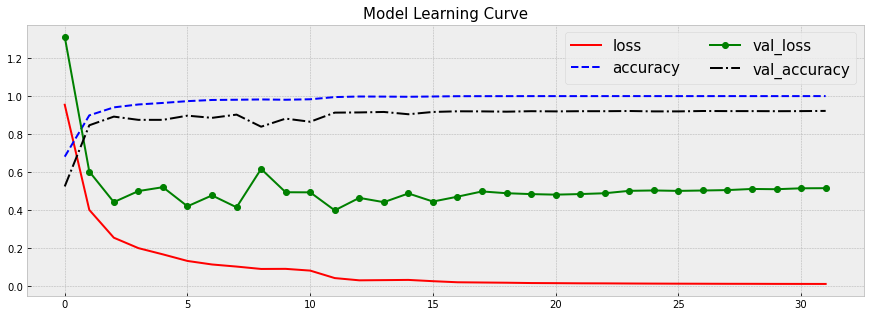

In [152]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [13]:
from keras.models import load_model
model = load_model('models/fixed_data/model_6.h5')

2023-10-06 22:40:06.164655: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-06 22:40:07.309969: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 78911 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:0f:00.0, compute capability: 8.0
2023-10-06 22:40:07.313080: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 78911 MB memory:  -> device: 1, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:4e:00.0, compute capability: 8.0


In [153]:
y_train = np.argmax(model.predict(X_train), axis=1)
print(classification_report(t_train, y_train, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       1.00      1.00      1.00      3000
        Fear       1.00      1.00      1.00      3000
       Happy       1.00      1.00      1.00      3000
         Sad       1.00      1.00      1.00      3000
   Surprised       1.00      1.00      1.00      3000
     Neutral       1.00      1.00      1.00      3000

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



In [154]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.91      0.94      0.92       486
        Fear       0.87      0.85      0.86       261
       Happy       0.97      0.98      0.98       424
         Sad       0.88      0.84      0.86       268
   Surprised       0.96      0.92      0.94       275
     Neutral       0.93      0.94      0.93       286

    accuracy                           0.92      2000
   macro avg       0.92      0.91      0.92      2000
weighted avg       0.92      0.92      0.92      2000



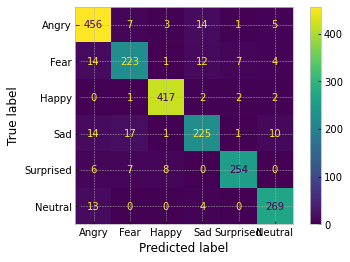

In [155]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

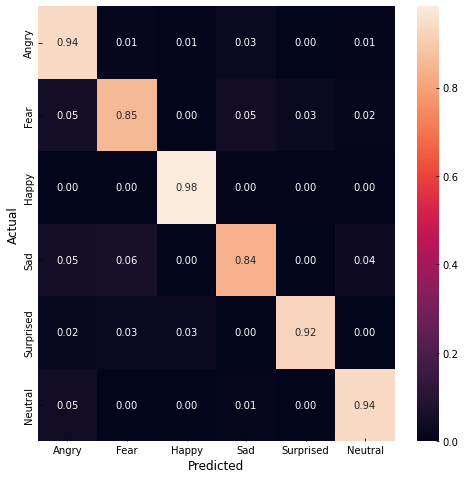

In [157]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [156]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_6_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 7

In [251]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.ResNet152V2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
# Freeze the specified number of layers
#for layer in base_model.layers[:100]:
#    layer.trainable = False
    
base_model.trainable = True    
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(64, 3, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
#x = keras.layers.MaxPooling2D()(x)
#x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(512, (1,2), padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
#x = keras.layers.MaxPool2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
#x = keras.layers.MaxPool2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Flatten()(x)
#x = keras.layers.Dense(256)
#x = keras.layers.BatchNormalization()(x)
#x = keras.layers.GlobalAveragePooling2D()(x)
#x = keras.layers.Dropout(0.5)(x)


outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])     

model.summary()

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 
history = model.fit(X_train, t_train, epochs=300, batch_size=32,
                    validation_data=(X_val, t_val),
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=20,monitor='val_loss')])

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_1  (None, 224, 224, 3)      0         
 3 (TFOpLambda)                                                  
                                                                 
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 conv2d_32 (Conv2D)          (None, 7, 7, 32)          65568     
                                                                 
 batch_normalization_9 (Batc  (None, 7, 7, 32)         128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 3, 3, 32)         0  

In [252]:
# Save the model as h5 file
model.save('models/fixed_data/model_7_rr.h5') 

In [253]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 2s 36ms/step - loss: 0.5269 - accuracy: 0.9185


[0.5269032716751099, 0.9185000061988831]

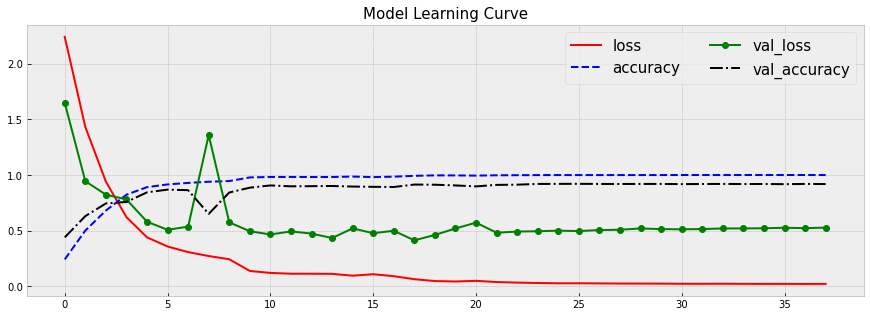

In [254]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [255]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.93      0.93      0.93       486
        Fear       0.84      0.85      0.85       261
       Happy       0.97      0.99      0.98       424
         Sad       0.85      0.84      0.84       268
   Surprised       0.96      0.92      0.94       275
     Neutral       0.92      0.94      0.93       286

    accuracy                           0.92      2000
   macro avg       0.91      0.91      0.91      2000
weighted avg       0.92      0.92      0.92      2000



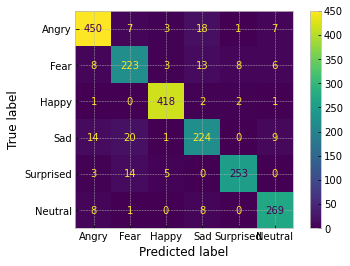

In [256]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

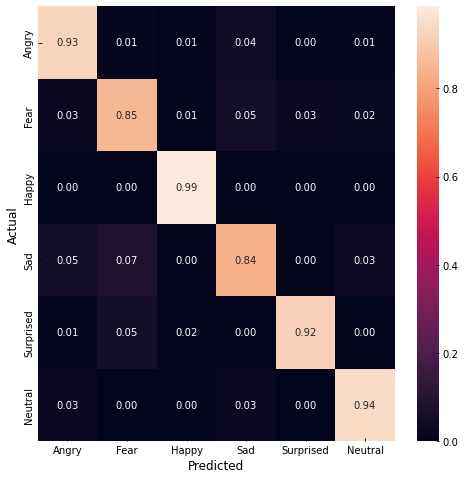

In [257]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

# Model 8

In [283]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.MobileNetV2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
base_model.trainable = True
# Freeze the specified number of layers
#for layer in base_model.layers[:100]:
#    layer.trainable = False

inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
outputs = keras.layers.Dense(6, activation='softmax', 
                             kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,        
                              min_lr=1e-9)        

model.summary()
history = model.fit(X_train, t_train, batch_size=32, epochs=800, 
                    validation_data=(X_val, t_val),
                    callbacks=[reduce_lr, keras.callbacks.EarlyStopping(patience=20,
                                                            monitor='val_loss')])

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_41 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_1  (None, 224, 224, 3)      0         
 9 (TFOpLambda)                                                  
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_9   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_36 (Dropout)        (None, 1280)              0         
                                                          

In [284]:
# Save the model as h5 file
model.save('models/fixed_data/model8_rr.h5') 

In [286]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 10ms/step - loss: 0.3332 - accuracy: 0.9170


[0.3332110643386841, 0.9169999957084656]

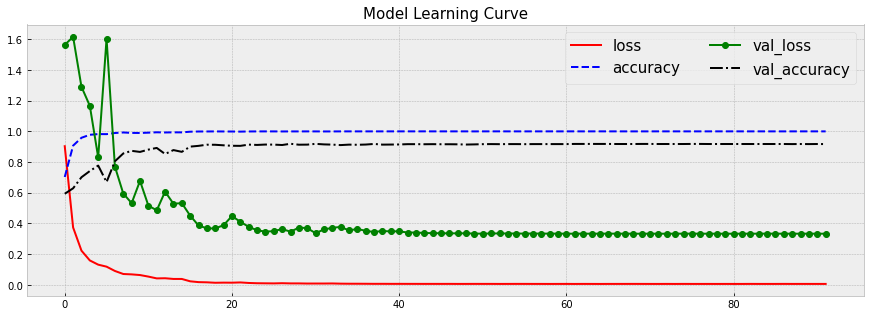

In [288]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [289]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.91      0.93      0.92       486
        Fear       0.89      0.84      0.86       261
       Happy       0.95      0.98      0.97       424
         Sad       0.86      0.84      0.85       268
   Surprised       0.94      0.95      0.95       275
     Neutral       0.93      0.92      0.92       286

    accuracy                           0.92      2000
   macro avg       0.91      0.91      0.91      2000
weighted avg       0.92      0.92      0.92      2000



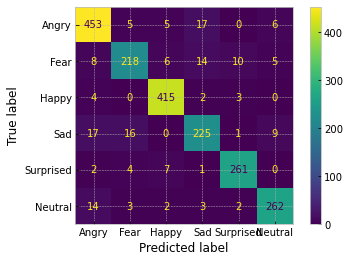

In [290]:
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

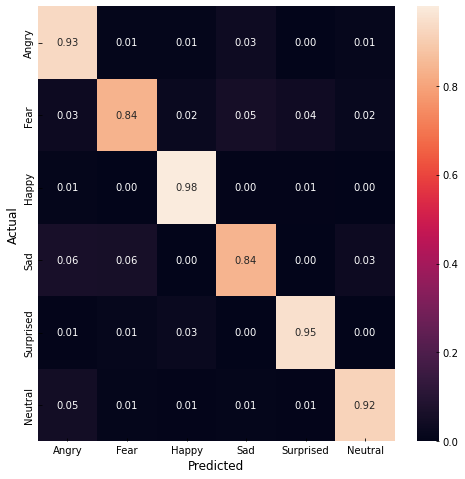

In [291]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [292]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model_8_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 9

In [293]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.ResNet152V2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
# Freeze the specified number of layers
for layer in base_model.layers[:100]:
    layer.trainable = False
    
base_model.trainable=True 
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
x = base_model(x)

x = keras.layers.Conv2D(32, 1, padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-2))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Conv2D(64, 3, padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-2))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Conv2D(128, 5, padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-2))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Conv2D(512, (1,2), padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-2))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.2)(x)

#x = keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(x)
#x = keras.layers.BatchNormalization()(x)
#x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Flatten()(x)

outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)


model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=1e-4),
              metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        

model.summary()
history = model.fit(X_train, t_train, batch_size=32, epochs=800,
                    validation_data=(X_val, t_val),
                    callbacks=[reduce_lr, 
                               keras.callbacks.EarlyStopping(patience=25,monitor='val_loss')])

Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_43 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_2  (None, 224, 224, 3)      0         
 0 (TFOpLambda)                                                  
                                                                 
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 conv2d_43 (Conv2D)          (None, 7, 7, 32)          65568     
                                                                 
 batch_normalization_20 (Bat  (None, 7, 7, 32)         128       
 chNormalization)                                                
                                                                 
 max_pooling2d_47 (MaxPoolin  (None, 3, 3, 32)         0  

In [294]:
# Save the model as h5 file
model.save('models/fixed_data/model_9_rr.h5') 

In [295]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 2s 35ms/step - loss: 0.4695 - accuracy: 0.9250


[0.4694838225841522, 0.925000011920929]

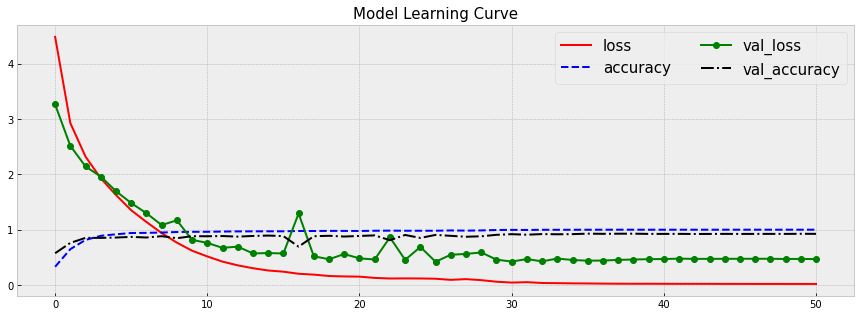

In [296]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [297]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.94      0.93      0.94       486
        Fear       0.86      0.85      0.86       261
       Happy       0.97      0.99      0.98       424
         Sad       0.86      0.83      0.84       268
   Surprised       0.95      0.94      0.95       275
     Neutral       0.93      0.95      0.94       286

    accuracy                           0.93      2000
   macro avg       0.92      0.92      0.92      2000
weighted avg       0.92      0.93      0.92      2000



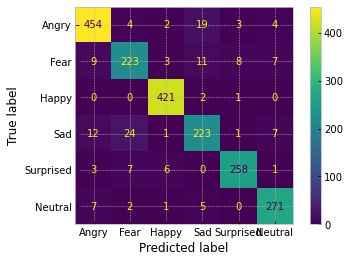

In [298]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

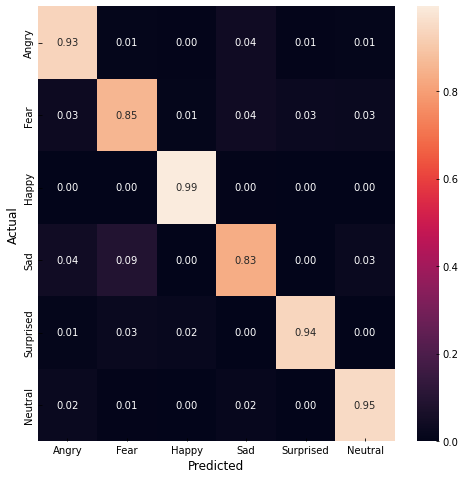

In [299]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [300]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model9_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 10

In [301]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.ResNet152V2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
# Freeze the specified number of layers
for layer in base_model.layers[:300]:
    layer.trainable = False
    
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
x = base_model(x)

x = keras.layers.Conv2D(32, 1, padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-3))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Conv2D(64, 3, padding='same', activation='relu',kernel_regularizer=keras.regularizers.l2(1e-2))(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)


x = keras.layers.Flatten()(x)

outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)


model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=1e-4),
              metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        
model.summary()
history = model.fit(X_train, t_train, batch_size=32, epochs=800,
                    validation_data=(X_val, t_val),
                    callbacks=[reduce_lr, 
                               keras.callbacks.EarlyStopping(
                                   patience=25,monitor='val_loss')])

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_45 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_2  (None, 224, 224, 3)      0         
 1 (TFOpLambda)                                                  
                                                                 
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 conv2d_47 (Conv2D)          (None, 7, 7, 32)          65568     
                                                                 
 batch_normalization_24 (Bat  (None, 7, 7, 32)         128       
 chNormalization)                                                
                                                                 
 max_pooling2d_52 (MaxPoolin  (None, 3, 3, 32)         0  

In [302]:
# Save the model as h5 file
model.save('models/fixed_data/model_10_rr.h5') 

In [303]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 2s 36ms/step - loss: 0.4764 - accuracy: 0.9100


[0.47640085220336914, 0.9100000262260437]

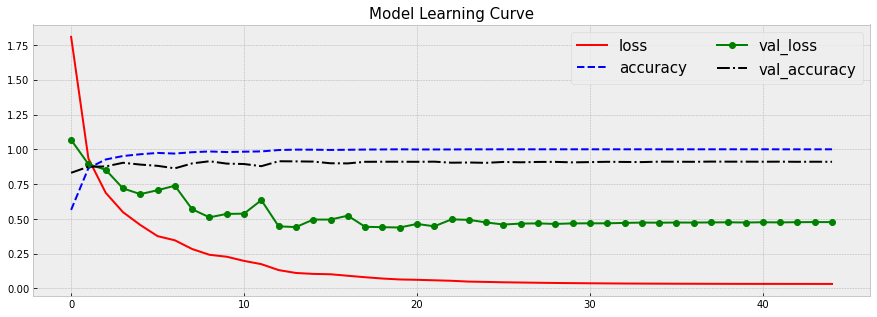

In [304]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [305]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.93      0.93      0.93       486
        Fear       0.84      0.82      0.83       261
       Happy       0.97      0.97      0.97       424
         Sad       0.81      0.83      0.82       268
   Surprised       0.94      0.92      0.93       275
     Neutral       0.92      0.92      0.92       286

    accuracy                           0.91      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.91      0.91      0.91      2000



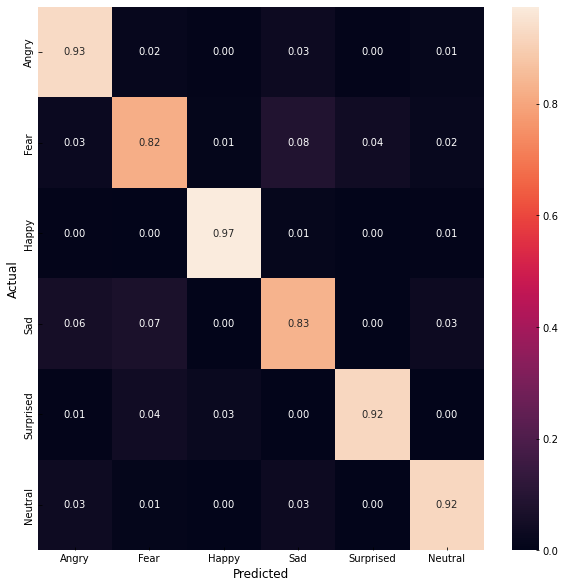

In [306]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

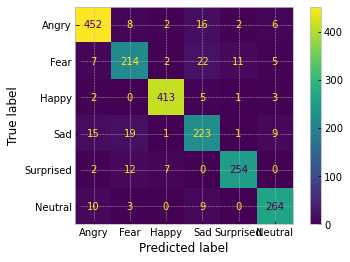

In [308]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

In [309]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model10_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 11

In [310]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.ResNet152V2(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)
base_model.trainable=True
# Freeze the specified number of layers
for layer in base_model.layers[:100]:
    layer.trainable = False

inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
x = base_model(x)
x = keras.layers.Conv2D(32, 1, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(64, 3, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.MaxPooling2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(128, 5, padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
#x = keras.layers.MaxPooling2D()(x)
#x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(512, (1,2), padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
#x = keras.layers.MaxPool2D(pool_size=(2,2))(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Conv2D(512, (3,3), padding='same', activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.Flatten()(x)



outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        
model.summary()
history = model.fit(X_train, t_train, batch_size=32, epochs=800, 
                    validation_data=(X_val, t_val),
                    callbacks=[reduce_lr, keras.callbacks.EarlyStopping(patience=15,
                                                            monitor='val_loss')])

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_47 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_2  (None, 224, 224, 3)      0         
 2 (TFOpLambda)                                                  
                                                                 
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 conv2d_49 (Conv2D)          (None, 7, 7, 32)          65568     
                                                                 
 batch_normalization_26 (Bat  (None, 7, 7, 32)         128       
 chNormalization)                                                
                                                                 
 max_pooling2d_57 (MaxPoolin  (None, 3, 3, 32)         0  

In [ ]:
#1e-4 fourth pass
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-6),
             metrics=['accuracy'])
history = model.fit(X_train, t_train, batch_size=32, epochs=300, 
                    validation_data=(X_val, t_val),
                    initial_epoch=history.epoch[-1],
                    callbacks=[reduce_lr,keras.callbacks.EarlyStopping(patience=5,
                                                            monitor='val_loss')])

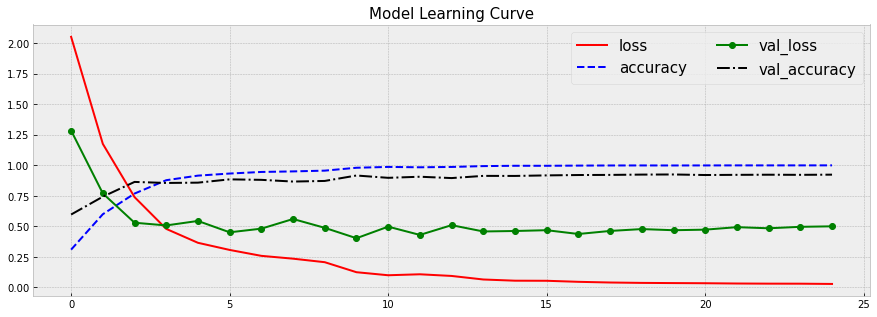

In [311]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [312]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 2s 35ms/step - loss: 0.5003 - accuracy: 0.9235


[0.5003283619880676, 0.9235000014305115]

In [313]:
# Save the model as h5 file
model.save('models/fixed_data/model_11_rr.h5') 

In [314]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.91      0.95      0.93       486
        Fear       0.89      0.84      0.86       261
       Happy       0.97      0.98      0.97       424
         Sad       0.87      0.88      0.88       268
   Surprised       0.95      0.93      0.94       275
     Neutral       0.94      0.91      0.92       286

    accuracy                           0.92      2000
   macro avg       0.92      0.91      0.92      2000
weighted avg       0.92      0.92      0.92      2000



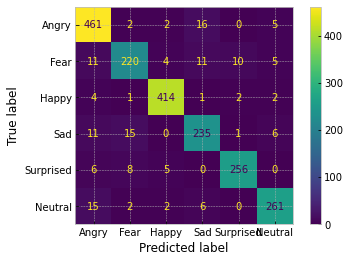

In [315]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

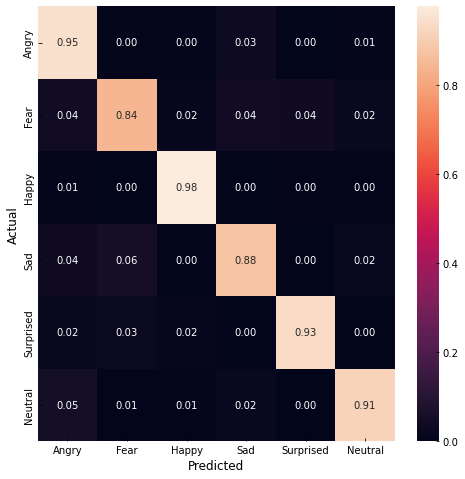

In [316]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [317]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_11_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 12

In [318]:
# Load base model with 'imagenet' as the weights
base_model = keras.applications.VGG16(weights='imagenet',
                                           input_shape=(224,224,3),
                                           include_top=False)

base_model.trainable = True
inputs = keras.Input(shape=(224,224,1))
x = tf.image.grayscale_to_rgb(inputs)
#x = tf.keras.applications.resnet_v2.preprocess_input(inputs)
x = base_model(x)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dense(128, activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.5)(x)  

x = keras.layers.Dense(64, activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(0.5)(x)


outputs = keras.layers.Dense(6, activation='softmax',
                            kernel_regularizer=keras.regularizers.l2(1e-2))(x)

model = keras.Model(inputs, outputs=outputs)
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
             optimizer=keras.optimizers.Adam(learning_rate=1e-4),
             metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        

model.summary()
history = model.fit(X_train, t_train, batch_size=32, epochs=800, 
                    validation_data=(X_val, t_val),
                    callbacks=[reduce_lr, keras.callbacks.EarlyStopping(patience=25,
                                                            monitor='val_loss')])

Model: "model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_49 (InputLayer)       [(None, 224, 224, 1)]     0         
                                                                 
 tf.image.grayscale_to_rgb_2  (None, 224, 224, 3)      0         
 3 (TFOpLambda)                                                  
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_10  (None, 512)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_35 (Dense)            (None, 128)               65664     
                                                                 
 batch_normalization_31 (Bat  (None, 128)              512

In [319]:
model.evaluate(X_train,t_train)
model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 14ms/step - loss: 1.1373 - accuracy: 0.5810


[1.1372720003128052, 0.5809999704360962]

In [320]:
# Save the model as h5 file
model.save('models/fixed_data/model_12_rr.h5') 

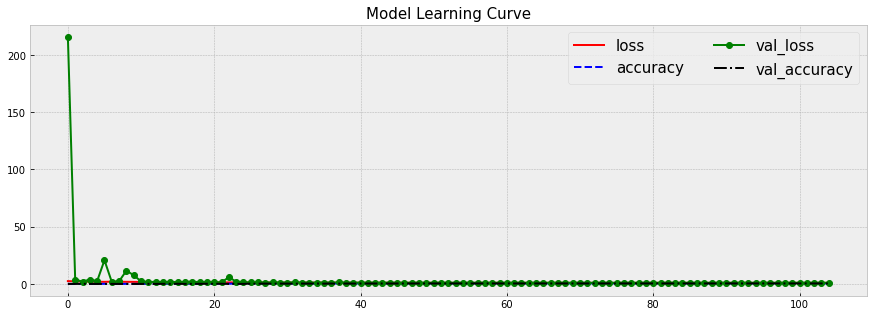

In [321]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [323]:
y_val = np.argmax(model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.53      0.11      0.18       486
        Fear       0.53      0.63      0.57       261
       Happy       0.61      0.81      0.70       424
         Sad       0.38      0.60      0.47       268
   Surprised       0.79      0.73      0.76       275
     Neutral       0.69      0.83      0.75       286

    accuracy                           0.58      2000
   macro avg       0.59      0.62      0.57      2000
weighted avg       0.59      0.58      0.54      2000



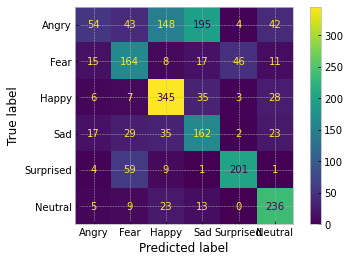

In [324]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

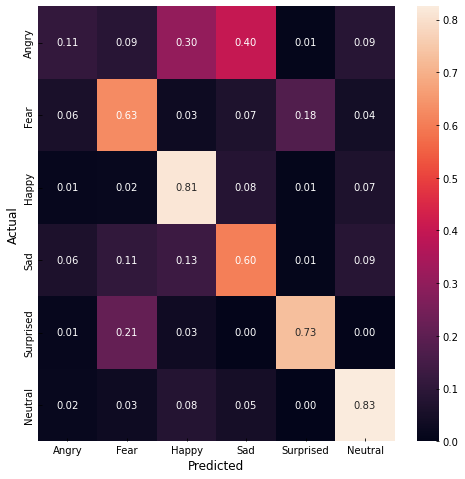

In [325]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [326]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/model_12_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 13

In [339]:
from tensorflow.keras import layers
base_model = tf.keras.models.Sequential()
base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
base_model.add(layers.Conv2D(filters=200, kernel_size=(5,5),strides=(2,2), padding='same', activation='relu', input_shape=(224,224,3)))
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Conv2D(filters=650, kernel_size=(5,5), activation='relu', padding='same',input_shape=(None,None,200)))
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Conv2D(filters=350, kernel_size=(5,5), activation='relu', padding='same',input_shape=(None,None,650)))
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Flatten())
base_model.add(layers.Dropout(0.5))
base_model.add(layers.Dense(128,activation='relu',input_shape=(1400,)))
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Dense(6, activation='softmax'))


base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),loss="sparse_categorical_crossentropy",
                   metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        

#base_model.summary()
#batch_size=32,
history = base_model.fit(X_train, t_train, epochs=100,batch_size=64,
                    validation_data=(X_val, t_val))

Epoch 1/100
282/282 [==============================] - 11s 39ms/step - loss: 1.7951 - accuracy: 0.1758 - val_loss: 1.7894 - val_accuracy: 0.1725
Epoch 2/100
282/282 [==============================] - 11s 38ms/step - loss: 1.7773 - accuracy: 0.1972 - val_loss: 1.7809 - val_accuracy: 0.1880
Epoch 3/100
282/282 [==============================] - 11s 38ms/step - loss: 1.7662 - accuracy: 0.2151 - val_loss: 1.7557 - val_accuracy: 0.2955
Epoch 4/100
282/282 [==============================] - 11s 38ms/step - loss: 1.7336 - accuracy: 0.2486 - val_loss: 1.7014 - val_accuracy: 0.2625
Epoch 5/100
282/282 [==============================] - 11s 38ms/step - loss: 1.6771 - accuracy: 0.2868 - val_loss: 1.6166 - val_accuracy: 0.3650
Epoch 6/100
282/282 [==============================] - 11s 38ms/step - loss: 1.6213 - accuracy: 0.3206 - val_loss: 1.5506 - val_accuracy: 0.4025
Epoch 7/100
282/282 [==============================] - 11s 38ms/step - loss: 1.5672 - accuracy: 0.3525 - val_loss: 1.4274 - val_ac

In [340]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 8ms/step - loss: 0.5717 - accuracy: 0.8740


[0.5717297792434692, 0.8740000128746033]

In [341]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_13_rr.h5') 

In [342]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.87      0.87      0.87       486
        Fear       0.82      0.82      0.82       261
       Happy       0.95      0.95      0.95       424
         Sad       0.81      0.82      0.81       268
   Surprised       0.92      0.88      0.90       275
     Neutral       0.84      0.87      0.85       286

    accuracy                           0.87      2000
   macro avg       0.87      0.87      0.87      2000
weighted avg       0.87      0.87      0.87      2000



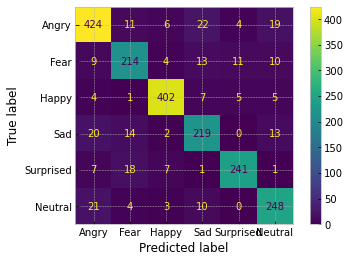

In [343]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

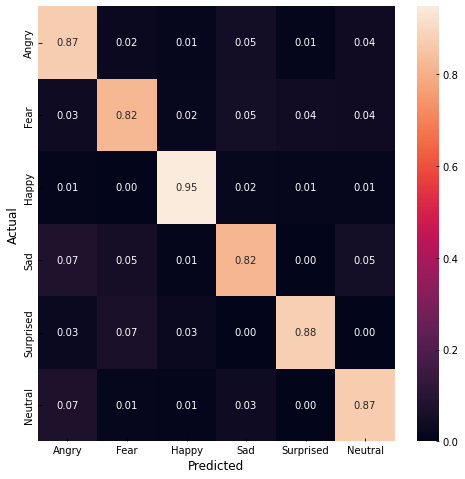

In [344]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

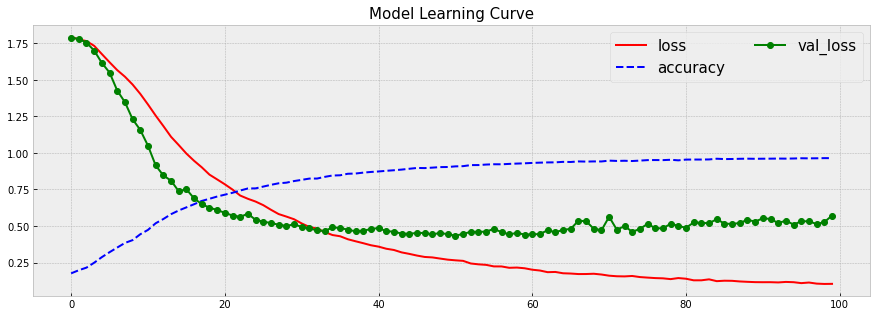

In [345]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);  

In [346]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_13_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 14

In [330]:
from tensorflow.keras import layers
base_model = tf.keras.models.Sequential()
base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
base_model.add(layers.Conv2D(filters=200, kernel_size=(5,5),strides=(2,2), padding='same', activation='relu', input_shape=(224,224,3)))
base_model.add(layers.BatchNormalization())
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Conv2D(filters=650, kernel_size=(5,5), activation='relu', padding='same',input_shape=(None,None,200)))
base_model.add(layers.BatchNormalization())
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Conv2D(filters=350, kernel_size=(5,5), activation='relu', padding='same',input_shape=(None,None,650)))
base_model.add(layers.BatchNormalization())
base_model.add(layers.MaxPool2D(3,3))
base_model.add(layers.Flatten())
base_model.add(layers.Dropout(0.5))
base_model.add(layers.Dense(128,activation='relu',input_shape=(1400,)))
base_model.add(layers.BatchNormalization())
base_model.add(layers.Dropout(0.6))
base_model.add(layers.Dense(6, activation='softmax'))


base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=4e-4),loss="sparse_categorical_crossentropy",
                   metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9)        

#base_model.summary()
#batch_size=32,
#callbacks=[reduce_lr, keras.callbacks.EarlyStopping(patience=25,monitor='val_loss')]
history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val))

Epoch 1/300
282/282 [==============================] - 14s 45ms/step - loss: 2.5343 - accuracy: 0.2121 - val_loss: 3.2758 - val_accuracy: 0.1450
Epoch 2/300
282/282 [==============================] - 12s 43ms/step - loss: 2.1351 - accuracy: 0.2417 - val_loss: 1.9510 - val_accuracy: 0.2655
Epoch 3/300
282/282 [==============================] - 12s 43ms/step - loss: 1.8986 - accuracy: 0.2754 - val_loss: 2.2899 - val_accuracy: 0.2905
Epoch 4/300
282/282 [==============================] - 12s 44ms/step - loss: 1.7242 - accuracy: 0.3189 - val_loss: 1.8238 - val_accuracy: 0.3255
Epoch 5/300
282/282 [==============================] - 12s 43ms/step - loss: 1.6006 - accuracy: 0.3603 - val_loss: 1.4276 - val_accuracy: 0.4265
Epoch 6/300
282/282 [==============================] - 12s 43ms/step - loss: 1.5199 - accuracy: 0.3906 - val_loss: 1.4669 - val_accuracy: 0.4540
Epoch 7/300
282/282 [==============================] - 12s 43ms/step - loss: 1.4399 - accuracy: 0.4336 - val_loss: 1.4174 - val_ac

In [331]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 9ms/step - loss: 0.5270 - accuracy: 0.8800


[0.5269507169723511, 0.8799999952316284]

In [332]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_14_rr.h5') 

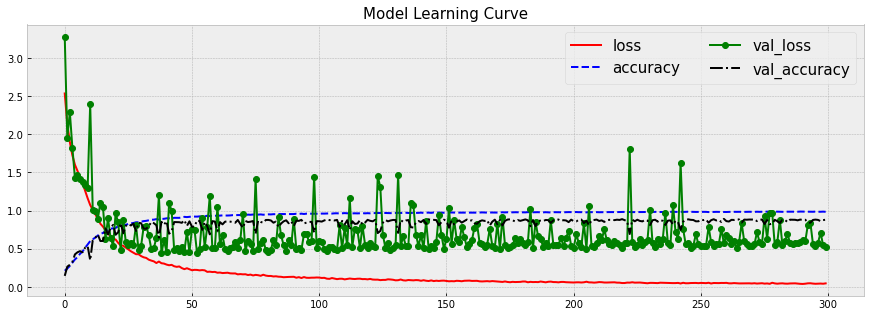

In [333]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);  

In [334]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.88      0.88      0.88       486
        Fear       0.89      0.79      0.84       261
       Happy       0.93      0.96      0.94       424
         Sad       0.87      0.77      0.81       268
   Surprised       0.89      0.92      0.91       275
     Neutral       0.81      0.91      0.85       286

    accuracy                           0.88      2000
   macro avg       0.88      0.87      0.87      2000
weighted avg       0.88      0.88      0.88      2000



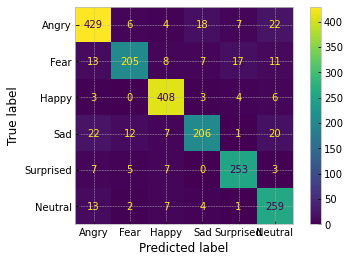

In [335]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

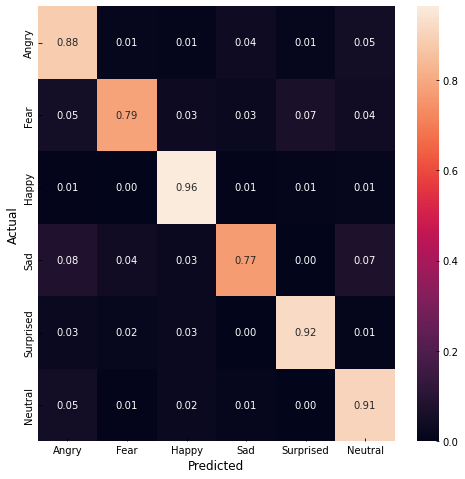

In [336]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [337]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(base_model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_14_rr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 15

In [347]:
vgg16_model = tf.keras.applications.VGG16(weights='imagenet',  
                                          include_top=False,   
                                          input_shape=(224, 224, 3))

base_model = tf.keras.models.Sequential()
base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
for layer in vgg16_model.layers:
    base_model.add(layer)
for layer in base_model.layers:
    layer.trainable = True
    
base_model.add(keras.layers.Flatten())
base_model.add(keras.layers.Dense(64, activation='relu'))
base_model.add(keras.layers.BatchNormalization())
base_model.add(keras.layers.Dropout(0.6))
base_model.add(layers.Dense(6, activation='softmax', kernel_regularizer=keras.regularizers.l2(1e-2)))


base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-2),
                   loss="sparse_categorical_crossentropy",
                   metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,         
                              patience=3,         
                              min_lr=1e-9) 

#base_model.summary()


# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(t_train), y=t_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val), class_weight=class_weight_dict,
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])


Epoch 1/300
282/282 [==============================] - 27s 94ms/step - loss: 1.8034 - accuracy: 0.2360 - val_loss: 1.9121 - val_accuracy: 0.1430 - lr: 0.0100
Epoch 2/300
282/282 [==============================] - 26s 92ms/step - loss: 1.7632 - accuracy: 0.2340 - val_loss: 1.7384 - val_accuracy: 0.2385 - lr: 0.0100
Epoch 3/300
282/282 [==============================] - 26s 93ms/step - loss: 1.7571 - accuracy: 0.2377 - val_loss: 2.3479 - val_accuracy: 0.2120 - lr: 0.0100
Epoch 4/300
282/282 [==============================] - 26s 93ms/step - loss: 1.7548 - accuracy: 0.2434 - val_loss: 1.9169 - val_accuracy: 0.1350 - lr: 0.0100
Epoch 5/300
282/282 [==============================] - 26s 93ms/step - loss: 1.7544 - accuracy: 0.2450 - val_loss: 1.7877 - val_accuracy: 0.2570 - lr: 0.0100
Epoch 6/300
282/282 [==============================] - 26s 93ms/step - loss: 1.7432 - accuracy: 0.2518 - val_loss: 1.8147 - val_accuracy: 0.2630 - lr: 0.0050
Epoch 7/300
282/282 [==============================]

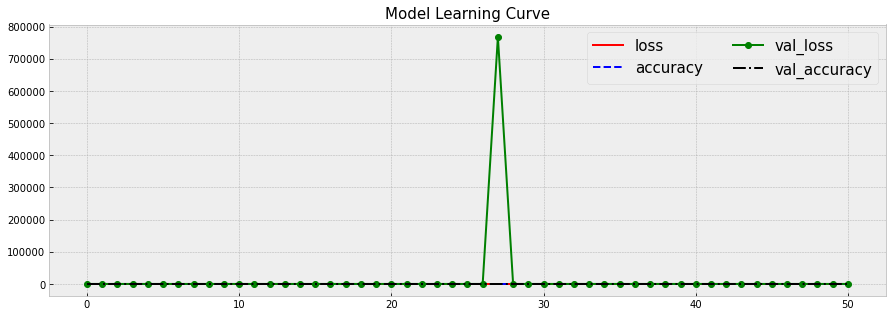

In [349]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k']
plt.figure(figsize=(15,5))
for i in range(len(key_names)-1):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15);   

In [350]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_15_rr_1.h5') 

In [351]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 14ms/step - loss: 0.6774 - accuracy: 0.8420


[0.6773664355278015, 0.8420000076293945]

In [352]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.83      0.85      0.84       486
        Fear       0.76      0.77      0.77       261
       Happy       0.93      0.94      0.93       424
         Sad       0.75      0.74      0.75       268
   Surprised       0.91      0.85      0.88       275
     Neutral       0.84      0.84      0.84       286

    accuracy                           0.84      2000
   macro avg       0.84      0.83      0.83      2000
weighted avg       0.84      0.84      0.84      2000



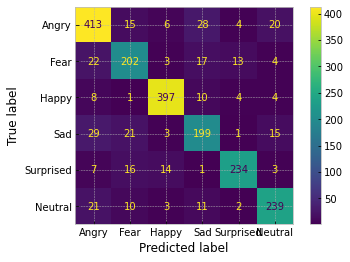

In [353]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

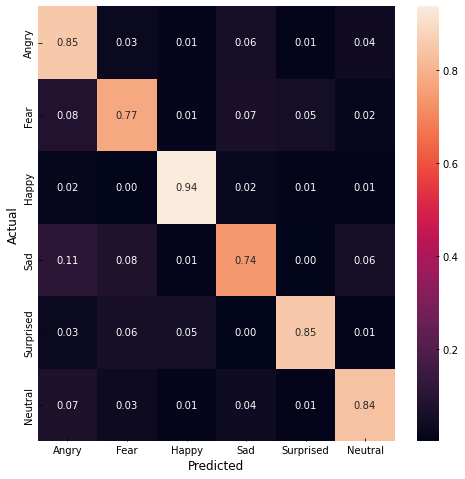

In [354]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [355]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(base_model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_15_rr_1.tflite', 'wb') as f:
  f.write(tflite_model)

# MODEL 16 w/ GPU and JAFFE

In [ ]:
from tensorflow.keras import layers
# Load base model with 'imagenet' as the weights
with strategy.scope():
    vgg16_model = tf.keras.applications.VGG16(weights='imagenet',  
                                          include_top=False,   
                                          input_shape=(224, 224, 3))

    base_model = tf.keras.models.Sequential()
    for layer in vgg16_model.layers:
        base_model.add(layer)
    for layer in base_model.layers:
        layer.trainable = True
    base_model.add(keras.layers.Flatten())
    base_model.add(keras.layers.Dense(128, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-2))) 
    base_model.add(keras.layers.BatchNormalization())
    base_model.add(keras.layers.Dropout(0.6))
    base_model.add(layers.Dense(6, activation='softmax',
                                kernel_regularizer=keras.regularizers.l2(1e-2))) # Regularize layer to reduce overfit


    base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                       loss="sparse_categorical_crossentropy",
                       metrics=['accuracy'])

    # Define a learning rate scheduler callback
    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 

    base_model.summary()

In [140]:
# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(t_train), y=t_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val), class_weight=class_weight_dict,
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])

2023-10-13 21:45:01.029957: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:766] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_106048"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:4492"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: -1
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
. Consider either turning off auto-sharding or switching the auto_shard_policy to DATA to shard this dataset.

Epoch 1/300
94/94 [==============================] - ETA: 0s - loss: 3.9270 - accuracy: 0.2468

2023-10-13 21:45:11.446529: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:766] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_111012"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:4522"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 64
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
. Consider either turning off auto-sharding or switching the auto_shard_policy to DATA to shard this dataset.

94/94 [==============================] - 12s 85ms/step - loss: 3.9270 - accuracy: 0.2468 - val_loss: 4.5246 - val_accuracy: 0.1406 - lr: 1.0000e-04
Epoch 2/300
94/94 [==============================] - 6s 59ms/step - loss: 2.5860 - accuracy: 0.4408 - val_loss: 3.4509 - val_accuracy: 0.3594 - lr: 1.0000e-04
Epoch 3/300
94/94 [==============================] - 6s 59ms/step - loss: 1.8348 - accuracy: 0.6808 - val_loss: 3.7686 - val_accuracy: 0.3125 - lr: 1.0000e-04
Epoch 4/300
94/94 [==============================] - 6s 60ms/step - loss: 1.3483 - accuracy: 0.8233 - val_loss: 5.3381 - val_accuracy: 0.3281 - lr: 1.0000e-04
Epoch 5/300
94/94 [==============================] - 6s 59ms/step - loss: 1.0171 - accuracy: 0.9062 - val_loss: 4.1436 - val_accuracy: 0.4688 - lr: 1.0000e-04
Epoch 6/300
94/94 [==============================] - 6s 60ms/step - loss: 0.7921 - accuracy: 0.9662 - val_loss: 1.2298 - val_accuracy: 0.7812 - lr: 5.0000e-05
Epoch 7/300
94/94 [==============================] - 6s 5

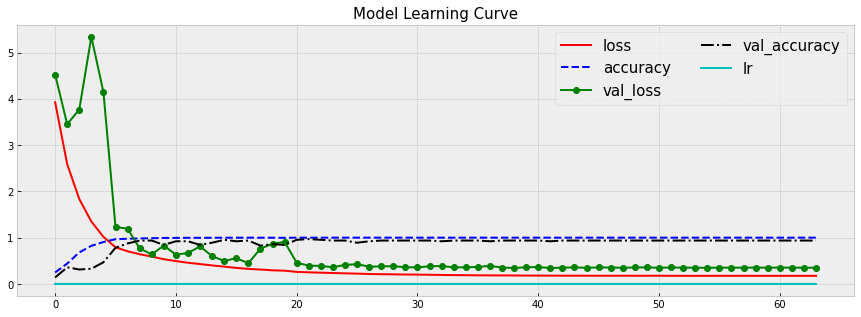

In [141]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k', '-c']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15); 

In [142]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_JAFFE_1.h5') 

In [143]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

2023-10-13 21:51:08.660021: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:766] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_153030"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:5239"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: -1
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
. Consider either turning off auto-sharding or switching the auto_shard_policy to DATA to shard this dataset.

188/188 [==============================] - 4s 14ms/step - loss: 0.1633 - accuracy: 1.0000


2023-10-13 21:51:12.841827: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:766] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_154740"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:5265"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 32
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
. Consider either turning off auto-sharding or switching the auto_shard_policy to DATA to shard this dataset.

2/2 [==============================] - 1s 10ms/step - loss: 0.3532 - accuracy: 0.9375


[0.3531656265258789, 0.9375]

In [144]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

2023-10-13 21:51:14.244190: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:766] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Did not find a shardable source, walked to a node which is not a dataset: name: "FlatMapDataset/_9"
op: "FlatMapDataset"
input: "PrefetchDataset/_8"
attr {
  key: "Targuments"
  value {
    list {
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: -2
  }
}
attr {
  key: "f"
  value {
    func {
      name: "__inference_Dataset_flat_map_slice_batch_indices_155432"
    }
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\023FlatMapDataset:5289"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 32
        }
      }
    }
  }
}
attr {
  key: "output_types"
  value {
    list {
      type: DT_INT64
    }
  }
}
. Consider either turning off auto-sharding or switching the auto_shard_policy to DATA to shard this dataset.

              precision    recall  f1-score   support

       Angry       0.90      1.00      0.95        18
        Fear       1.00      0.80      0.89        10
       Happy       1.00      1.00      1.00         9
         Sad       0.88      0.78      0.82         9
   Surprised       1.00      1.00      1.00         9
     Neutral       0.90      1.00      0.95         9

    accuracy                           0.94        64
   macro avg       0.95      0.93      0.93        64
weighted avg       0.94      0.94      0.94        64



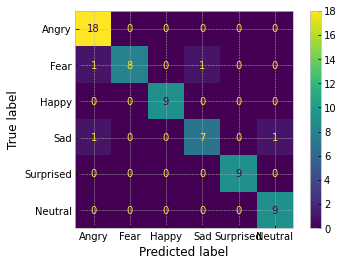

In [145]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

# Model 15 + GPU 

In [19]:
from tensorflow.keras import layers
# Load base model with 'imagenet' as the weights
with strategy.scope():
    vgg16_model = tf.keras.applications.VGG16(weights='imagenet',  
                                          include_top=False,   
                                          input_shape=(224, 224, 3))

    base_model = tf.keras.models.Sequential()
    base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
    for layer in vgg16_model.layers:
        base_model.add(layer)
    for layer in base_model.layers:
        layer.trainable = True
    base_model.add(keras.layers.Flatten())
    base_model.add(keras.layers.Dense(128, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-2))) 
    base_model.add(keras.layers.BatchNormalization())
    base_model.add(keras.layers.Dropout(0.6))
    base_model.add(layers.Dense(6, activation='softmax',
                                kernel_regularizer=keras.regularizers.l2(1e-2))) # Regularize layer to reduce overfit


    base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                       loss="sparse_categorical_crossentropy",
                       metrics=['accuracy'])

    # Define a learning rate scheduler callback
    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 


In [20]:
# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(t_train), y=t_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val), class_weight=class_weight_dict,
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])

Epoch 1/300
282/282 [==============================] - 29s 67ms/step - loss: 3.0522 - accuracy: 0.5118 - val_loss: 3.0759 - val_accuracy: 0.4930 - lr: 1.0000e-04
Epoch 2/300
282/282 [==============================] - 17s 59ms/step - loss: 1.6307 - accuracy: 0.7916 - val_loss: 1.5780 - val_accuracy: 0.7375 - lr: 1.0000e-04
Epoch 3/300
282/282 [==============================] - 16s 58ms/step - loss: 1.0983 - accuracy: 0.8824 - val_loss: 1.0515 - val_accuracy: 0.8525 - lr: 1.0000e-04
Epoch 4/300
282/282 [==============================] - 16s 58ms/step - loss: 0.7769 - accuracy: 0.9371 - val_loss: 1.0058 - val_accuracy: 0.8145 - lr: 1.0000e-04
Epoch 5/300
282/282 [==============================] - 17s 59ms/step - loss: 0.5738 - accuracy: 0.9593 - val_loss: 0.7603 - val_accuracy: 0.8595 - lr: 1.0000e-04
Epoch 6/300
282/282 [==============================] - 16s 58ms/step - loss: 0.4202 - accuracy: 0.9777 - val_loss: 0.6486 - val_accuracy: 0.8705 - lr: 1.0000e-04
Epoch 7/300
282/282 [=======

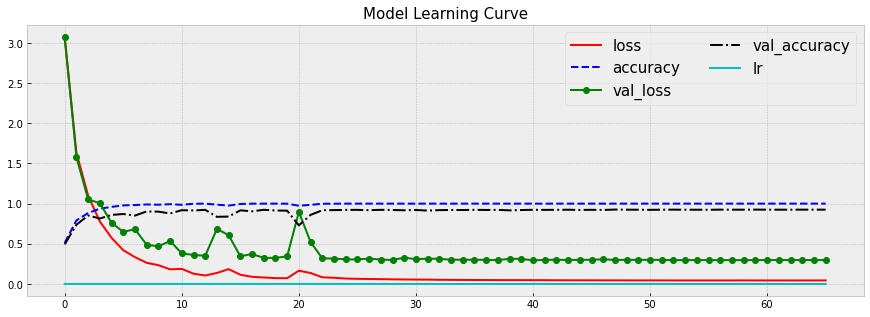

In [21]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k', '-c']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15); 

In [22]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 12ms/step - loss: 0.2968 - accuracy: 0.9250


[0.29682597517967224, 0.925000011920929]

In [23]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.93      0.93      0.93       486
        Fear       0.88      0.87      0.88       261
       Happy       0.97      0.98      0.97       424
         Sad       0.85      0.88      0.87       268
   Surprised       0.97      0.92      0.94       275
     Neutral       0.94      0.93      0.93       286

    accuracy                           0.93      2000
   macro avg       0.92      0.92      0.92      2000
weighted avg       0.93      0.93      0.93      2000



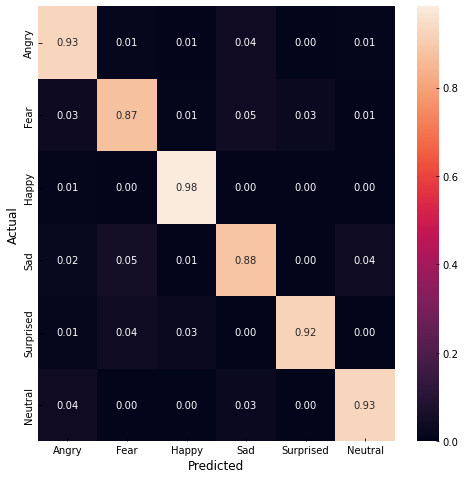

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

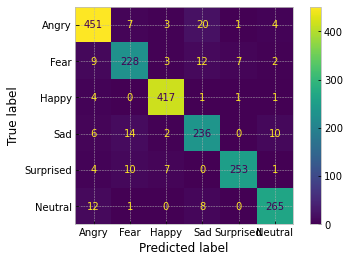

In [25]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

In [26]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_15_rr_2.h5') 

In [27]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(base_model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_15_rr_2.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 15+ GPU
## no regularizer

In [28]:
from tensorflow.keras import layers
# Load base model with 'imagenet' as the weights

vgg16_model = tf.keras.applications.VGG16(weights='imagenet',  
                                          include_top=False,   
                                          input_shape=(224, 224, 3))

base_model = tf.keras.models.Sequential()
base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
for layer in vgg16_model.layers:
    base_model.add(layer)
for layer in base_model.layers:
    layer.trainable = True
base_model.add(keras.layers.Flatten())
base_model.add(keras.layers.Dense(128, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-2))) 
base_model.add(keras.layers.BatchNormalization())
base_model.add(keras.layers.Dropout(0.6))
base_model.add(layers.Dense(6, activation='softmax')) 


base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                       loss="sparse_categorical_crossentropy",
                       metrics=['accuracy'])

# Define a learning rate scheduler callback
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 


In [29]:
# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(t_train), y=t_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val), class_weight=class_weight_dict,
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])
base_model.summary()

Epoch 1/300
282/282 [==============================] - 31s 98ms/step - loss: 2.7574 - accuracy: 0.5105 - val_loss: 2.3419 - val_accuracy: 0.4900 - lr: 1.0000e-04
Epoch 2/300
282/282 [==============================] - 27s 95ms/step - loss: 1.3651 - accuracy: 0.8089 - val_loss: 1.4212 - val_accuracy: 0.7475 - lr: 1.0000e-04
Epoch 3/300
282/282 [==============================] - 27s 94ms/step - loss: 0.8932 - accuracy: 0.9000 - val_loss: 3.8480 - val_accuracy: 0.4325 - lr: 1.0000e-04
Epoch 4/300
282/282 [==============================] - 27s 94ms/step - loss: 0.6292 - accuracy: 0.9416 - val_loss: 0.6897 - val_accuracy: 0.8875 - lr: 1.0000e-04
Epoch 5/300
282/282 [==============================] - 27s 94ms/step - loss: 0.4483 - accuracy: 0.9657 - val_loss: 0.6112 - val_accuracy: 0.8910 - lr: 1.0000e-04
Epoch 6/300
282/282 [==============================] - 27s 94ms/step - loss: 0.3206 - accuracy: 0.9836 - val_loss: 0.5356 - val_accuracy: 0.8920 - lr: 1.0000e-04
Epoch 7/300
282/282 [=======

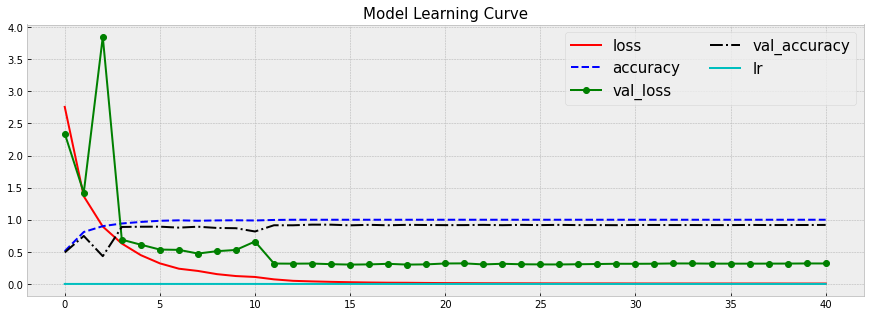

In [30]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k', '-c']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15); 

In [31]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

63/63 [==============================] - 1s 14ms/step - loss: 0.3187 - accuracy: 0.9190


[0.31871676445007324, 0.9190000295639038]

In [32]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.92      0.93      0.92       486
        Fear       0.88      0.88      0.88       261
       Happy       0.96      0.98      0.97       424
         Sad       0.83      0.85      0.84       268
   Surprised       0.96      0.93      0.94       275
     Neutral       0.94      0.91      0.92       286

    accuracy                           0.92      2000
   macro avg       0.91      0.91      0.91      2000
weighted avg       0.92      0.92      0.92      2000



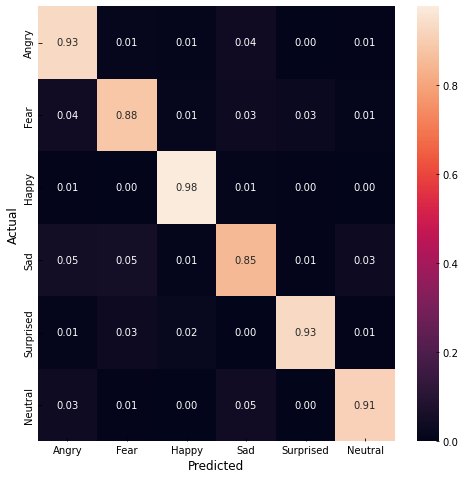

In [33]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

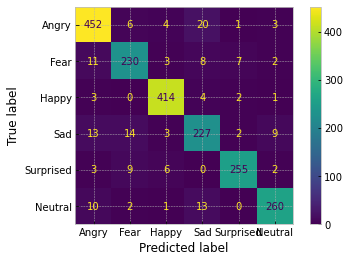

In [34]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(t_val, y_val, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

In [35]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_15_rr_nr.h5') 

In [36]:
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(base_model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_15_rr_nr.tflite', 'wb') as f:
  f.write(tflite_model)

# Model 15 testing

In [ ]:
X_train = X_train.astype(np.float32)
X_val = X_val.astype(np.float32)
from tensorflow.keras import layers
# Load base model with 'imagenet' as the weights
with strategy.scope():
    vgg16_model = tf.keras.applications.VGG16(weights='imagenet',  
                                          include_top=False,   
                                          input_shape=(224, 224, 3))

    base_model = tf.keras.models.Sequential()
    base_model.add(keras.layers.Lambda(tf.image.grayscale_to_rgb))
    for layer in vgg16_model.layers:
        base_model.add(layer)
    for layer in base_model.layers:
        layer.trainable = True
    base_model.add(keras.layers.Flatten())
    base_model.add(keras.layers.Dense(128, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-2))) 
    base_model.add(keras.layers.BatchNormalization())
    base_model.add(keras.layers.Dropout(0.6))
    base_model.add(layers.Dense(6, activation='softmax',
                                kernel_regularizer=keras.regularizers.l2(1e-2))) # Regularize layer to reduce overfit


    base_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                       loss="sparse_categorical_crossentropy",
                       metrics=['accuracy'])

    # Define a learning rate scheduler callback
    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                  factor=0.5,         
                                  patience=3,         
                                  min_lr=1e-9) 

    
    
# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(t_train), y=t_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
history = base_model.fit(X_train, t_train, epochs=300, batch_size=64,
                    validation_data=(X_val, t_val), class_weight=class_weight_dict,
                        callbacks=[reduce_lr, keras.callbacks.EarlyStopping(
                            patience=25,monitor='val_loss')])

Epoch 1/300
282/282 [==============================] - 22s 65ms/step - loss: 4.0882 - accuracy: 0.2404 - val_loss: 3.8244 - val_accuracy: 0.2370 - lr: 1.0000e-04
Epoch 2/300
282/282 [==============================] - 16s 58ms/step - loss: 3.3313 - accuracy: 0.2233 - val_loss: 16.0036 - val_accuracy: 0.1535 - lr: 1.0000e-04
Epoch 3/300
282/282 [==============================] - 17s 60ms/step - loss: 2.7344 - accuracy: 0.3398 - val_loss: 2.5299 - val_accuracy: 0.3105 - lr: 1.0000e-04
Epoch 4/300
282/282 [==============================] - 17s 59ms/step - loss: 2.0988 - accuracy: 0.4992 - val_loss: 1.9288 - val_accuracy: 0.4550 - lr: 1.0000e-04
Epoch 5/300
282/282 [==============================] - 16s 58ms/step - loss: 1.6284 - accuracy: 0.6251 - val_loss: 1.4605 - val_accuracy: 0.6585 - lr: 1.0000e-04
Epoch 6/300
282/282 [==============================] - 16s 58ms/step - loss: 1.1882 - accuracy: 0.7523 - val_loss: 1.0415 - val_accuracy: 0.8020 - lr: 1.0000e-04
Epoch 7/300
282/282 [======

In [ ]:
key_names = list(history.history.keys())
colors = ['-r', '--b', '-og', '-.k', '-c']
plt.figure(figsize=(15,5))
for i in range(len(key_names)):
    plt.plot(history.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15, ncol=2)
plt.title('Model Learning Curve', size=15); 

In [ ]:
base_model.evaluate(X_train,t_train)
base_model.evaluate(X_val, t_val)

In [ ]:
y_val = np.argmax(base_model.predict(X_val), axis=1)
print(classification_report(t_val, y_val, target_names=labels_names))

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(t_val, y_val)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [ ]:
# Save the model as h5 file
base_model.save('models/fixed_data/model_15_t.h5') 
# Convert the model
converter = tf.lite.TFLiteConverter.from_keras_model(base_model)
tflite_model = converter.convert()

# Save the model.
with open('models/fixed_data/model_15_t.tflite', 'wb') as f:
  f.write(tflite_model)

## Apply model to test data

In [117]:
# Loading Test Data
X_test_full = np.load('fixed_data/test_b_data.npy').T
t_test_full = np.load('fixed_data/test_b_labels.npy')

print(X_test_full.shape, t_test_full.shape)

(60, 50176) (60,)


In [118]:
X_test_full.dtype, t_test_full.dtype

(dtype('uint8'), dtype('int32'))

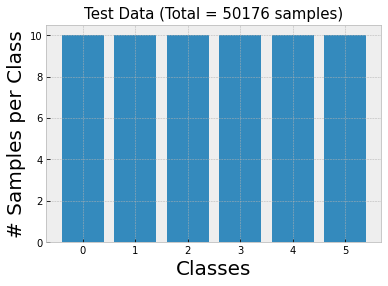

In [119]:
# Counting number samples per class
vals, counts = np.unique(t_test_full, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(6),range(6))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Test Data (Total = '+str(X_test_full.shape[1])+' samples)',size=15);

In [120]:
X_test_full = X_test_full.reshape(X_test_full.shape[0], 224, 224, 1)/255.0
print(X_test_full.shape, X_test_full.dtype)

(60, 224, 224, 1) float64


In [121]:
model.evaluate(X_test_full,t_test_full)

2/2 [==============================] - 0s 37ms/step - loss: 0.1498 - accuracy: 0.9667


[0.14980563521385193, 0.9666666388511658]

In [122]:
y_test = np.argmax(model.predict(X_test_full), axis=1)
print(classification_report(t_test_full, y_test, target_names=labels_names))

              precision    recall  f1-score   support

       Angry       0.91      1.00      0.95        10
        Fear       1.00      1.00      1.00        10
       Happy       1.00      1.00      1.00        10
         Sad       1.00      0.90      0.95        10
   Surprised       0.91      1.00      0.95        10
     Neutral       1.00      0.90      0.95        10

    accuracy                           0.97        60
   macro avg       0.97      0.97      0.97        60
weighted avg       0.97      0.97      0.97        60



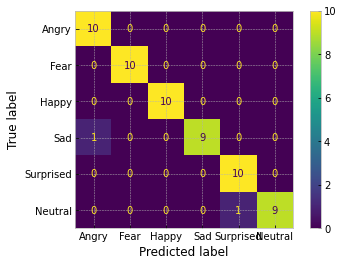

In [123]:
cm = confusion_matrix(t_test_full, y_test, labels=[0,1,2,3,4,5])
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=labels_names)
disp.plot()
plt.show()

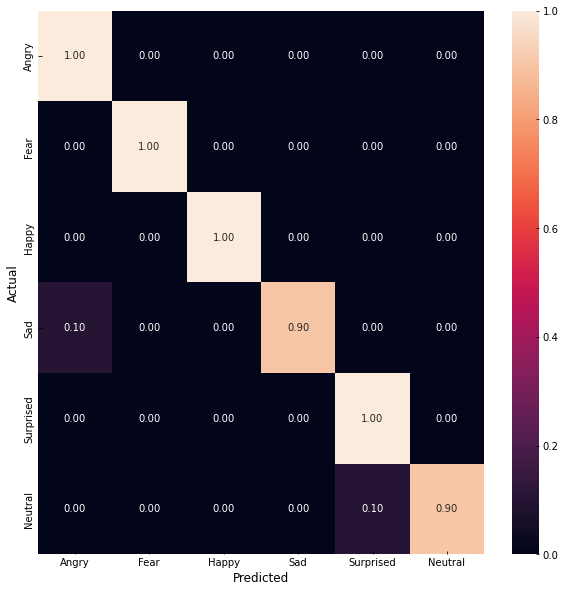

In [124]:
cm = confusion_matrix(t_test_full, y_test)
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels_names, yticklabels=labels_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

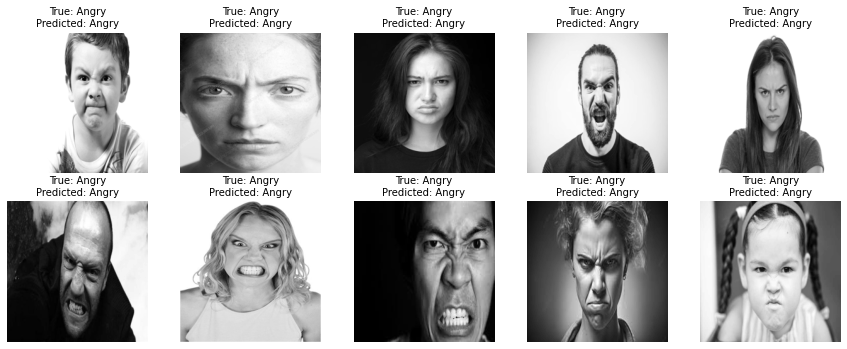

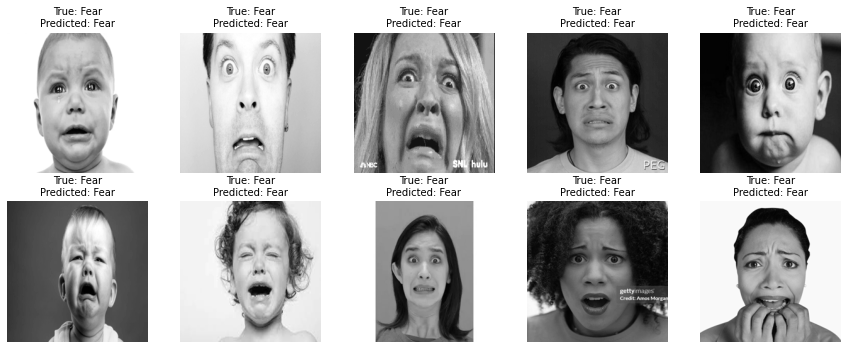

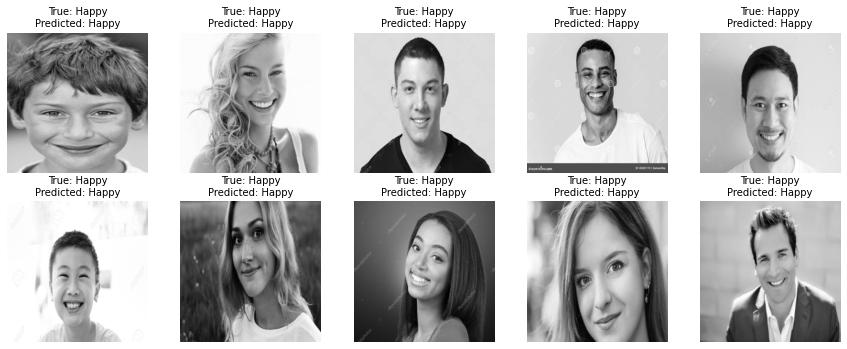

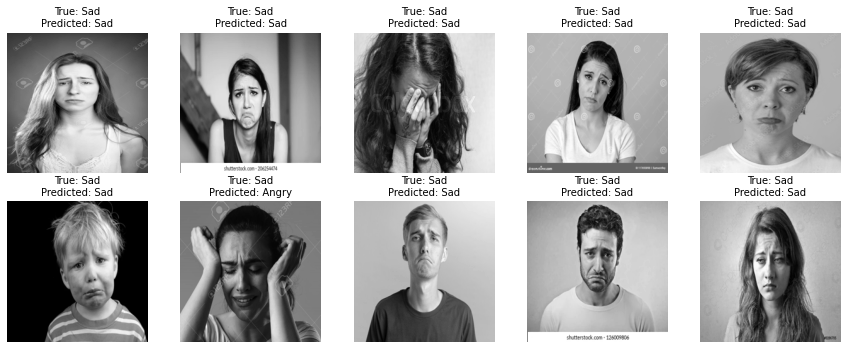

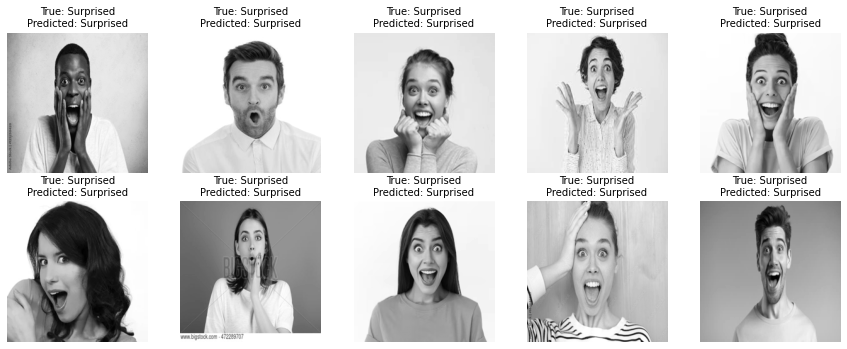

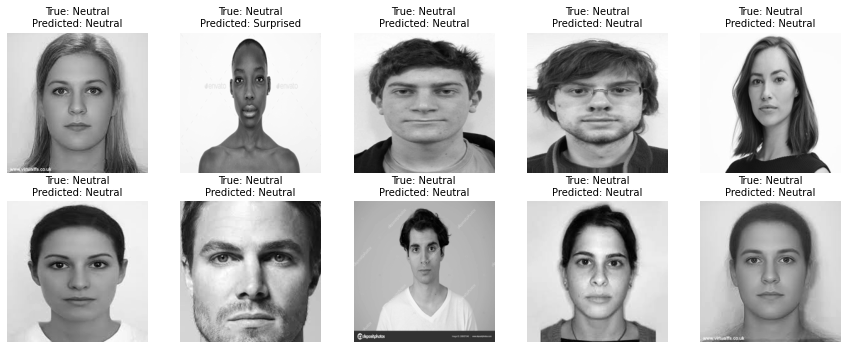

In [125]:
for i in range(0,6):
    rnd_sample = npr.permutation(np.where(t_test_full==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(10):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_test_full[rnd_sample[j]], cmap='gray')
        label_idx = int(y_test[rnd_sample[j]])
        true_label_idx = int(t_test_full[rnd_sample[j]])
        
        plt.axis('off');
        #plt.title('Label '+str(label_idx)+': '+labels_names[label_idx],size=15)
        # Create the label text
        label_text = f'True: {labels_names[true_label_idx]}\nPredicted: {labels_names[label_idx]}'
        plt.title(label_text, size=10)
    plt.show()
    print('\n\n')